# **Desigualdades socioeconómicas mundiales: un enfoque sobre la urbanización, la paridad de género, la salud y más.**
#### Guido Rocatti

## **1- Presentación del problema específico.**

La base de datos elegida fue armada de distintas fuentes para Hackathon TrueCue Women+Data. Es un seguimiento del desempeño de 173 países respecto a métricas de sustentabilidad, en su mayoría socioeconómicas, a lo largo de 19 años (2000-2018).
Es un conjunto de datos muy diverso, que da lugar a un gran número de oportunidades de análisis. En esta ocasión me interesa centrarme en los siguientes temas:

- Diferencias socioeconómicas entre países mayormente urbanos y rurales.

- Avances sobre políticas inclusivas de género.

- Variables socioeconómicas que permitan clasificar el ingreso económico de un país.

- Explorar variables que influyen significativamente en el PBI per cápita.


Muchas veces escuchamos hablar de una creciente desigualdad en la riqueza y de una disminución de la calidad de vida a nivel mundial. Una mayor urbanización, a priori, se asocia con una mayor planificación que se traduce en el acceso mejorado de la población a servicios básicos y a una mejor condición de vida, pero ¿esto es realmente así? ¿Hay mejor acceso a servicios en los países urbanos? ¿vemos mejoras económicas y de salud (por ejemplo en la nutrición y expectativa de vida) en estos países? Si vemos una mejora en las condiciones de vida, ¿esto estaría asociado a una disminución de la pobreza en las poblaciones?
¿Cuáles son los factores que nos permitirían predecir incrementos o disminuciones del PBI per cápita? ¿Qué variables nos ayudarían a entender mejor cómo un país tiene determinada clase de ingreso económico y no otra?

Por otro lado, esta creciente desigualdad económica muchas veces se ve profundizada al enfocarse en diferencias de género. Las mujeres enfrentan mayores dificultades a la hora de conseguir un empleo, y por lo tanto, un ascenso económico. Existen políticas que buscan acortar (y eliminar) esa brecha económica de género, y eso entonces lleva a pensar: ¿una mayor participación femenina en la política, se traduce en un menor desempleo femenino?
Existe la idea de que el trabajo rural está vinculado mayormente al hombre, entonces: ¿es esperable que el desempleo femenino aumente considerablemente en países con poblaciones mayormente rurales?

Este trabajo busca, a través de distintas herramientas analíticas, ayudar a alcanzar un mayor entendimiento de estas problemáticas, y sería un buen primer paso para que distintos organismos gubernamentales y no-gubernamentales diseñen políticascon fundamento que apunten a mejorar la vida de todos y todas.


## **2- Objetivos de la investigación.**

A partir de las problemáticas planteadas en el punto anterior, me planteo los siguientes objetivos:

- **a1)** Analizar a nivel regional el acceso de poblaciones urbanes y rurales a servicios básicos (agua potable, electricidad, internet) y sus indicadores de salud (prevalencia de desnutrición, expectativa de vida).

- **a2)** Explorar cómo se comporta el porcentaje de pobreza respecto a regiones mayoritariamente urbanas y rurales.

- **b1)** Examinar cuál es la tendencia de la participación política femenina de cada región, y si esta se asocia con el porcentaje de desempleo femenino.

- **b2)** Determinar si existe una relación significativa entre el porcentaje de poblaciones rurales de un país y el porcentaje de desempleo femenino.

- **c)** Explorar las variables más influyentes para determinar el PBI per cápita y desarrollar un modelo de predicción óptimo que permita estimarlo a partir de dichas variables.

- **d)** Generar un modelo de clasificación que permita determinar la clase de ingreso económico (en inglés: Income class) de un país.


## **3- Data Acquisition.**

### 3.1- Imports

In [ ]:
# Tratamiento de datos
import pandas as pd
import numpy as np

# Visualizacion de datos
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px

# Codificacion e imputacion de datos
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from sklearn.svm import OneClassSVM # Tratamiento outliers

# Modelos lineales predictivos, modelos de clasificacion y metricas
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance

from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_percentage_error, mean_squared_error
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import xgboost as xgb

# Tecnicas de optimizacion de hiperparametros

from sklearn.model_selection import RandomizedSearchCV

### 3.2- Dataset

In [ ]:
# Monto el Google Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
FILE_PATH = "#################################/WorldSustainabilityDataset_selected2.csv"

In [ ]:
data = pd.read_csv(FILE_PATH, sep = ';')

In [ ]:
print('Dimensiones de la base de datos cruda: ', data.shape)

Dimensiones de la base de datos cruda:  (3287, 27)


In [ ]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3287 entries, 0 to 3286
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Country              3287 non-null   object 
 1   Country_code         3287 non-null   object 
 2   Year                 3287 non-null   int64  
 3   Electricity          3193 non-null   float64
 4   Net_income_per_cap   2566 non-null   float64
 5   Children_out_school  2225 non-null   float64
 6   GDP                  3246 non-null   float64
 7   GDP_per_cap          3246 non-null   float64
 8   Fem_parliam          3062 non-null   float64
 9   Renew_output         2771 non-null   float64
 10  Renew_consum         3287 non-null   float64
 11  Undernour            1834 non-null   float64
 12  Poverty              1304 non-null   float64
 13  2_G                  2349 non-null   float64
 14  3_G                  1357 non-null   float64
 15  Water                1837 non-null   f

### 3.3. Descripción de Variables

- Country: Nombre del país

- Country_code: Código del país

- Year: año

- Electricity: Porcentaje de la población con acceso a la electricidad

- Net_income_per_cap: Porcentaje anual de crecimiento del ingreso económico neto de un país, dividido por su número de habitantes.

- Children_out_school: Porcentaje de niños en edad escolar **primaria** no escolarizados.

- GDP: Valor en USD del total de bienes y servicios producidos en un país. Equivalente al PBI o PIB en español.

- GDP_per_cap: GDP de un país dividido por el total de su población.

- Fem_parliam: Porcentaje de mujeres ocupando bancas en el parlamento

- Renew_output: Porcentaje de energía renovable producida respecto al total de la energía producida.

- Renew_consum: Porcentaje de energía renovable consumida respecto al total de energía producida.

- Undernour: Porcentaje de la población cuyo consumo habitual de alimentos es insuficiente para alcanzar la energía necesaria para mantener una vida activa y saludable. (% desnutrición)

- Poverty: Proporción de población debajo de la línea internacional de pobreza (vive con menos de 1.90USD diario).

- 2_G: Porcentaje de personas que habitan en el rango de cobertura de 2G (tengan o no celular)

- 3_G: Porcentaje de personas que habitan en el rango de cobertura de 3G (tengan o no celular)

- Water: Porcentaje de población con acceso sostenido a servicios básicos de agua potable.

- Unemp_male: Porcentaje de hombres en edad laboral desempleados, pero disponibles y buscando trabajo.

- Unemp_fem: Porcentaje de mujeres en edad laboral desempleadas, pero disponibles y buscando trabajo.

- Continent: Continente al que pertenece el país.

- Gini: Score otorgado en base a qué tan equitativamente está repartido el ingreso dentro de un país

- Income_class: Clasificación por tipo de ingreso (low, lower-middle, upper-middle, high) según país

- Internet: Porcentaje de la población con acceso a internet

- Life_exp: Esperanza de vida al nacer (años)

- Population: Población total.

- Rural_pop: Porcentaje de la población total de cada país que ocupa áreas rurales

- Urban_pop: Porcentaje de la población total de cada país que ocupa áreas urbanas

- Region: Región a la que pertenece el país.

In [ ]:
# Realizo una copia de la base de datos
df = data

## **4- Exploratory Data Analysis**

### 4.1. Chequeo y recuento de valores nulos por variable

In [ ]:
df.isnull().sum()

Country                   0
Country_code              0
Year                      0
Electricity              94
Net_income_per_cap      721
Children_out_school    1062
GDP                      41
GDP_per_cap              41
Fem_parliam             225
Renew_output            516
Renew_consum              0
Undernour              1453
Poverty                1983
2_G                     938
3_G                    1930
Water                  1450
Unemp_male             1480
Unemp_fem              1481
Continent                 0
Gini                   1984
Income_class              0
Internet                301
Life_exp                191
Population              181
Rural_pop                 9
Urban_pop               181
Region                    0
dtype: int64

##### **Observación**: algunas variables exhiben más del 50% de datos nulos respecto del total de casos (n = 3287)

### 4.2. Cheque casos duplicados

In [ ]:
df.duplicated().any()

False

##### No hay casos duplicados en nuestra base de datos.

### 4.3. Label Encoding de variable 'Income Class'.
##### Antes de continuar con el análisis básico de las variables, codifico numéricamente (numérica ordinal) la variable Income Class para poder usarla posteriormente.

In [ ]:
# Utilizo Label Encoder para convertir la variable

label_encoder = LabelEncoder()

df['Income_Class_Encoded'] = label_encoder.fit_transform(
    df['Income_class'])

print(df['Income_class'].value_counts())
print(df['Income_Class_Encoded'].value_counts())

High_income            899
Lower-middle_income    868
Upper-middle_income    765
Low_income             755
Name: Income_class, dtype: int64
0    899
2    868
3    765
1    755
Name: Income_Class_Encoded, dtype: int64


#### De este modo, la variable codificada queda de la siguiente manera:
- **High Income** = 0 (899 casos)
- **Low Income** = 1 (755 casos)
- **Lower-middle Income** = 2 (868 casos)
- **Upper-middle Income** = 3 (765 casos)

### 4.4. Imputación de datos con K-Nearest Neighbors (KNN)

##### El algoritmo encuentra los vecinos más cercanos a una muestra de datos con valores faltantes, y luego utiliza los valores de los vecinos para imputar el valor faltante en la muestra.

In [ ]:
# Creo un objeto imputador KNN con k = 3
imputer = KNNImputer(n_neighbors=3)

df1 = df.select_dtypes(exclude = 'object') # Creo una copia del dataframe sin las variables de tipo objeto
df1 = pd.DataFrame(imputer.fit_transform(df1), columns=df1.columns) # Imputo los datos de variables numericas
df1['Continent'], df1['Region'], df1['Country'] = df['Continent'], df['Region'], df['Country'] # Reinserto en mi nuevo df la informacion geografica
df1.columns

Index(['Year', 'Electricity', 'Net_income_per_cap', 'Children_out_school',
       'GDP', 'GDP_per_cap', 'Fem_parliam', 'Renew_output', 'Renew_consum',
       'Undernour', 'Poverty', '2_G', '3_G', 'Water', 'Unemp_male',
       'Unemp_fem', 'Gini', 'Internet', 'Life_exp', 'Population', 'Rural_pop',
       'Urban_pop', 'Income_Class_Encoded', 'Continent', 'Region', 'Country'],
      dtype='object')

In [ ]:
df1.isna().sum() # Chequeo si se han imputado datos en todo mi nuevo dataframe

Year                    0
Electricity             0
Net_income_per_cap      0
Children_out_school     0
GDP                     0
GDP_per_cap             0
Fem_parliam             0
Renew_output            0
Renew_consum            0
Undernour               0
Poverty                 0
2_G                     0
3_G                     0
Water                   0
Unemp_male              0
Unemp_fem               0
Gini                    0
Internet                0
Life_exp                0
Population              0
Rural_pop               0
Urban_pop               0
Income_Class_Encoded    0
Continent               0
Region                  0
Country                 0
dtype: int64

In [ ]:
df1.head(3)

,Year,Electricity,Net_income_per_cap,Children_out_school,GDP,GDP_per_cap,Fem_parliam,Renew_output,Renew_consum,Undernour,...,Gini,Internet,Life_exp,Population,Rural_pop,Urban_pop,Income_Class_Encoded,Continent,Region,Country
0,2000.0,91.660398,0.890372,1.60268,1.873453e+09,20617.75047,12.266667,0.0,0.1753,20.666667,...,39.333333,20.93,71.858667,20245763.0,53.283,53.991667,0.0,North_America,Latin_America_and_Caribbean,Aruba
1,2001.0,100.000000,0.502859,0.32258,1.920112e+09,20670.36701,21.362445,0.0,0.1805,19.533333,...,38.266667,17.10,73.853000,92892.0,53.661,46.339000,0.0,North_America,Latin_America_and_Caribbean,Aruba
2,2002.0,100.000000,7.427997,1.81634,1.941341e+09,20436.88713,21.362445,0.0,0.1814,29.200000,...,39.933333,18.80,73.937000,94992.0,54.028,45.972000,0.0,North_America,Latin_America_and_Caribbean,Aruba


### 4.5. Análisis univariado


#### 4.5.1. Estadística descriptiva

In [ ]:
df1.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Year,3287.0,2.009000e+03,5.480000e+00,2.000000e+03,2.004000e+03,2.009000e+03,2.014000e+03,2.018000e+03
Electricity,3287.0,7.849000e+01,3.047000e+01,1.270000e+00,5.618000e+01,9.826000e+01,1.000000e+02,1.000000e+02
Net_income_per_cap,3287.0,2.470000e+00,1.679000e+01,-6.456600e+02,-1.600000e-01,2.390000e+00,5.360000e+00,2.294900e+02
Children_out_school,3287.0,1.610000e+01,1.599000e+01,0.000000e+00,1.600000e+00,8.080000e+00,3.308000e+01,7.310000e+01
GDP,3287.0,3.478565e+11,1.397063e+12,1.811170e+08,6.650207e+09,2.571327e+10,1.740000e+11,2.060000e+13
GDP_per_cap,3287.0,1.229805e+04,1.772637e+04,9.053000e+01,1.277790e+03,4.405410e+03,1.509568e+04,1.188236e+05
Fem_parliam,3287.0,1.821000e+01,1.081000e+01,0.000000e+00,1.013000e+01,1.702000e+01,2.353000e+01,6.375000e+01
Renew_output,3287.0,2.780000e+01,3.286000e+01,0.000000e+00,5.400000e-01,1.258000e+01,5.097000e+01,1.000000e+02
Renew_consum,3287.0,3.267000e+01,2.992000e+01,0.000000e+00,6.840000e+00,2.266000e+01,5.464000e+01,9.834000e+01
Undernour,3287.0,2.052000e+01,1.263000e+01,2.500000e+00,8.720000e+00,1.720000e+01,3.427000e+01,6.750000e+01


#### 4.5.2. Gráficos de Histograma por variable

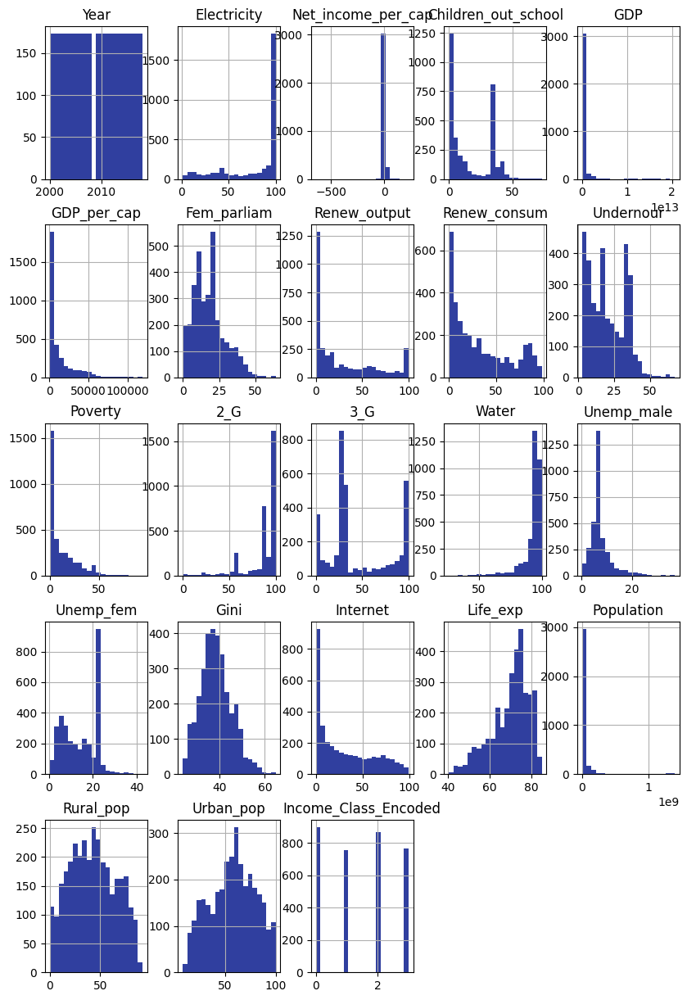

In [ ]:
df1.hist(bins=20, figsize=(10,15), color = '#303F9F')
plt.show()

##### **Comentarios sobre histogramas de variables**:

1) `Electricity`: el histograma nos permite notar a primera vista que la mayor parte de los países cuenta con un alto porcentaje de acceso a la red eléctrica.

2) `Net Income per cap`: la mayor parte de los registros muestra valores negativos, lo que se traduce en que la tendencia es a la disminución del ingreso neto per cápita.

3) `Children out of school`: los bajos valores de deserción escolar primaria exhiben una mayor frecuencia, a pesar de que hay un grupo considerable de casos (alrededor de 750) con una deserción cercana al 30%.

4) `GDP per cap`: podemos ver rápidamente que la tendencia general está orientada hacia un bajo PBI per cápita en USD.

5) `Fem_parliam`: este histograma muestra una asimetría hacia la izquierda, donde la mayor cantidad de casos poseen un porcentaje de participación femenina en parlamentos menor al 25%.

6) `Renew_output`: este gráfico nos adelanta que aún falta mucho trabajo para lograr aumentar el porcentaje de energía renovable producida respecto al total producido, ya que las frecuencias más altas se encuentran por debajo del 10%.

7) `Renew_consum`: al igual que el histograma anterior, y por estar las variables relacionadas, el consumo de energías renovables es principalmente bajo, por eso los bajos porcentajes son los más frecuentes.

8) `Undernour`: desafortunadamente, los porcentajes de desnutrición, si bien están por debajo del 50%, muestran una distribución moderadamente equiparada dentro de esos porcentajes. Es decir, si bien vemos muchos casos en que la desnutrición es menor al 10%, también tenemos gran cantidad de casos con valores alrededor del 30% de desnutrición, dato que es **alarmante**.

9) `Poverty`: es curioso ver que hay valores altos de desnutrición pero la gran mayoría de los casos muestra que los países tienen porcentajes muy bajos de pobreza, por debajo del 10%. **A priori uno podría pensar que estas últimas dos variables se encontarían estrechamente relacionadas.**

10) `2_G`: al ser esta una tecnología básica, es normal que presente una alta frecuencia de porcentajes altos de población dentro del área de cobertura del servicio 2G.

11) `3_G`: a diferencia de la variable anterior, la cobertura de 3G es una tecnología ligeramente más avanzada que la de 2G, y en este caso las frecuencias de porcentajes de cobertura se encuentran distribuidos de manera más equitativa. Encontramos muchos casos con un porcentaje bajo, medio y alto de cobertura.

12) `Water`: afortunadamente, los porcentajes cercanos al 100% de acceso a sistemas de agua potable son los más frecuentes, aunque aún quedan casos que se encuentran debajo del 50% de acceso. En estos casos es importante recordar que los datos no dejan de representar a poblaciones de países enteros con un muy bajo acceso al agua potable.

13) `Unemp_male`: en general las frecuencias de distribución del porcentaje de desempleo masculino están orientadas hacia bajos valores.

14) `Unemp_fem`: sobre este histograma cabe destacar que el desempleo femenino es frecuentement más alto que el masculino, lo que puede indicar una brecha laboral de género en muchos países.

15) `Gini`: el índice de Gini varía entre 0 y 100, representando el 100 la total desigualdad y el 0 la total equidad. El histograma nos muestra que las mayores frecuencias de valores del índice Gini se encuentran en los valores moderados, entre 30 y 60, principalmente tendientes a valores más bajos que altos. Es decir, es más frecuente encontrar casos con una equidad moderada.

16) `Internet`: es notoria la alta frecuencia de poblaciones con un muy bajo porcentaje de acceso a Internet. Otro indicador que expone la gran desigualdad entre los países del mundo.

17) `Life_exp`: el histograma nos muestra que la mayor parte de los casos tiene una alta expectativa de vida, entre los 65 y aproximadamente los 80 años. Sin embargo, existe un número de casos (que sumados superan los 100) con una expectativa de vida muy baja, entre los 40 y los 50 años.

18) `Population`: en este gráfico podemos ver que hay una pequeña cantidad de países con más de $1 · 10^8$ habitantes, que actúan como outliers.

19) `Rural_pop`: vemos que esta variable exhibe una distribución de frecuencias similar a la distribución teórica normal, con una mayor frecuencia de porcentajes intermedios de poblaciones rurales. La media de esta variable se encuentra entre el 40% y el 50%, y la mediana casi coincide con este valor.

20) `Urban_pop`: al igual que con la población rural, la distribución de frecuencias de esta variable también se asemeja a aquella distribución teórica normal. Con una mediana casi idéntica a la media, que a su vez es cercana al 50%. A su vez, esta variable parece comportarse de manera inversa al porcentaje de población rural, algo esperable si se piensa en lo que representa cada variable.

21) `Income_class_encoded`: este histograma nos muestra que hay una distribución considerablemente equiparada entre las frecuencias de las distintas clases de ingreso económico, siendo las clases más frecuentes las de altos ingresos e ingresos medios-bajos.


#### 4.5.3. Gráficos Boxplot por variable

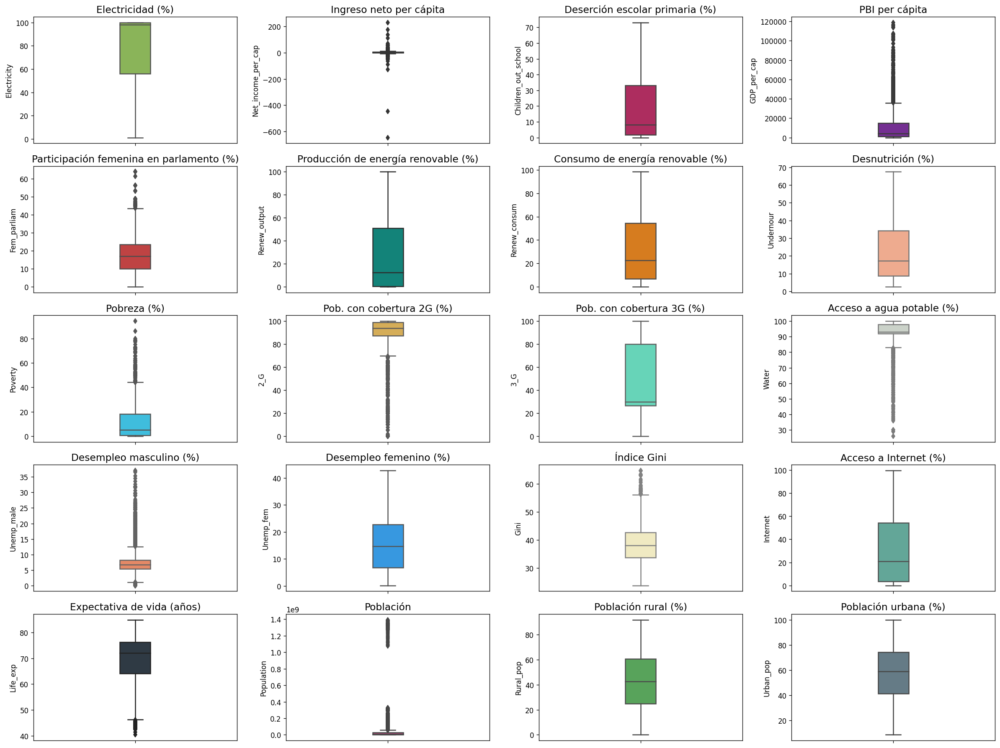

In [ ]:
fig, ax = plt.subplots(nrows=5,ncols=4,dpi=120,figsize = (20,15))


ax[0,0].set_title('Electricidad (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Electricity'], data=df1, color='#8BC34A', width = 0.15, ax = ax[0,0])

ax[0,1].set_title('Ingreso neto per cápita',fontdict={'fontsize':14})
sns.boxplot(y = df1['Net_income_per_cap'], data=df1, color='#455A64', width = 0.15, ax = ax[0,1])

ax[0,2].set_title('Deserción escolar primaria (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Children_out_school'], data=df1, color='#C2185B', width = 0.15, ax = ax[0,2])

ax[0,3].set_title('PBI per cápita',fontdict={'fontsize':14})
sns.boxplot(y = df1['GDP_per_cap'], data=df1, color='#7B1FA2', width = 0.15, ax = ax[0,3])

ax[1,0].set_title('Participación femenina en parlamento (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Fem_parliam'], data=df1, color='#D32F2F', width = 0.15, ax = ax[1,0])

ax[1,1].set_title('Producción de energía renovable (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Renew_output'], data=df1, color='#009688', width = 0.15, ax = ax[1,1])

ax[1,2].set_title('Consumo de energía renovable (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Renew_consum'], data=df1, color='#F57C00', width = 0.15, ax = ax[1,2])

ax[1,3].set_title('Desnutrición (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Undernour'], data=df1, color='#FEA47F', width = 0.15, ax = ax[1,3])

ax[2,0].set_title('Pobreza (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Poverty'], data=df1, color='#25CCF7', width = 0.15, ax = ax[2,0])

ax[2,1].set_title('Pob. con cobertura 2G (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['2_G'], data=df1, color='#EAB543', width = 0.15, ax = ax[2,1])

ax[2,2].set_title('Pob. con cobertura 3G (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['3_G'], data=df1, color='#55E6C1', width = 0.15, ax = ax[2,2])

ax[2,3].set_title('Acceso a agua potable (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Water'], data=df1, color='#CAD3C8', width = 0.15, ax = ax[2,3])

ax[3,0].set_title('Desempleo masculino (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Unemp_male'], data=df1, color='#F97F51', width = 0.15, ax = ax[3,0])

ax[3,1].set_title('Desempleo femenino (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Unemp_fem'], data=df1, color='#1B9CFC', width = 0.15, ax = ax[3,1])

ax[3,2].set_title('Índice Gini',fontdict={'fontsize':14})
sns.boxplot(y = df1['Gini'], data=df1, color='#F8EFBA', width = 0.15, ax = ax[3,2])

ax[3,3].set_title('Acceso a Internet (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Internet'], data=df1, color='#58B19F', width = 0.15, ax = ax[3,3])

ax[4,0].set_title('Expectativa de vida (años)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Life_exp'], data=df1, color='#2C3A47', width = 0.15, ax = ax[4,0])

ax[4,1].set_title('Población',fontdict={'fontsize':14})
sns.boxplot(y = df1['Population'], data=df1, color='#B33771', width = 0.15, ax = ax[4,1])

ax[4,2].set_title('Población rural (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Rural_pop'], data=df1, color='#4CAF50', width = 0.15, ax = ax[4,2])

ax[4,3].set_title('Población urbana (%)',fontdict={'fontsize':14})
sns.boxplot(y = df1['Urban_pop'], data=df1, color='#607D8B', width = 0.15, ax = ax[4,3])


plt.tight_layout()
plt.show()

#plt.savefig('Boxplot todas.svg', dpi = 150)

##### Al analizar los boxplot generados podemos notar que muchas variables cuentan con un número significativo de outliers, que posteriormente deberá tratarse para su análisis.

### 4.6. Tratamiento de Outliers

##### 4.6.1. Opcion 1: **One-Class SVM**

In [ ]:
# Creo una copia de df1 para mi modelo One-Class SVM
X = df1.select_dtypes(exclude = ['object'])
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3287 entries, 0 to 3286
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Year                  3287 non-null   float64
 1   Electricity           3287 non-null   float64
 2   Net_income_per_cap    3287 non-null   float64
 3   Children_out_school   3287 non-null   float64
 4   GDP                   3287 non-null   float64
 5   GDP_per_cap           3287 non-null   float64
 6   Fem_parliam           3287 non-null   float64
 7   Renew_output          3287 non-null   float64
 8   Renew_consum          3287 non-null   float64
 9   Undernour             3287 non-null   float64
 10  Poverty               3287 non-null   float64
 11  2_G                   3287 non-null   float64
 12  3_G                   3287 non-null   float64
 13  Water                 3287 non-null   float64
 14  Unemp_male            3287 non-null   float64
 15  Unemp_fem            

In [ ]:
# Entreno el modelo
ocsvm = OneClassSVM()
ocsvm.fit(X)

OneClassSVM()

In [ ]:
# Identifico los outliers usando el modelo entrenado
outliers = ocsvm.predict(X)

##### 4.6.2. Eliminar los outliers.

In [ ]:
# Elimino outliers, creando un dataframe que incluya solo valores no-outlier.
df_limpio = df1[outliers == 1]
df_limpio.shape

(1648, 26)

In [ ]:
df_limpio.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,1648.0,2.009675e+03,5.394645e+00,2.000000e+03,2.005000e+03,2.010000e+03,2.014000e+03,2.018000e+03
Electricity,1648.0,8.379632e+01,2.561473e+01,6.000000e+00,7.708411e+01,9.919980e+01,1.000000e+02,1.000000e+02
Net_income_per_cap,1648.0,3.270617e+00,1.555736e+01,-4.460945e+02,5.361421e-01,2.989109e+00,5.788698e+00,2.294931e+02
Children_out_school,1648.0,1.395653e+01,1.453071e+01,0.000000e+00,1.412748e+00,5.959740e+00,3.307553e+01,5.530304e+01
GDP,1648.0,8.332763e+10,8.115371e+10,1.111710e+10,2.006475e+10,4.791947e+10,1.312500e+11,3.130000e+11
GDP_per_cap,1648.0,1.216439e+04,1.727057e+04,1.624327e+02,1.901734e+03,4.990489e+03,1.500263e+04,1.188236e+05
Fem_parliam,1648.0,1.880696e+01,1.042392e+01,0.000000e+00,1.083333e+01,1.820255e+01,2.414571e+01,5.322314e+01
Renew_output,1648.0,2.740559e+01,3.128956e+01,0.000000e+00,5.377025e-01,1.246631e+01,4.977065e+01,1.000000e+02
Renew_consum,1648.0,2.965369e+01,2.831343e+01,0.000000e+00,5.986550e+00,2.005355e+01,4.708292e+01,9.794030e+01
Undernour,1648.0,2.076448e+01,1.321335e+01,2.500000e+00,7.900000e+00,1.825000e+01,3.436667e+01,6.320000e+01


##### 4.6.3 Opcion 2: **Rango Intercuartiles (IQR)**

In [ ]:
# Calculo los cuartiles Q1 y Q3 de mis variables y el rango entre ellos (IQR)

Q1 = X.quantile(0.25)
Q3 = X.quantile(0.75)

IQR = Q3 - Q1

# Calculo los limites inferior y superior para determinar outliers
limite_inf = Q1 - 1.5 * IQR
limite_sup = Q3 + 1.5 * IQR


In [ ]:
# Comparo los valores de mis datos con los limites que defini
outliers = ((X < limite_inf) | (X > limite_sup)).any(axis=1)


In [ ]:
df_limpio2 = df1[~outliers]
df_limpio2.shape

(1295, 26)

In [ ]:
df_limpio2.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,1295.0,2.009302e+03,5.533162e+00,2.000000e+03,2.005000e+03,2.009000e+03,2.014000e+03,2.018000e+03
Electricity,1295.0,8.108753e+01,2.865076e+01,3.186104e+00,6.834690e+01,9.856036e+01,1.000000e+02,1.000000e+02
Net_income_per_cap,1295.0,2.741337e+00,4.167744e+00,-8.428865e+00,1.402040e-01,2.556979e+00,5.332435e+00,1.356482e+01
Children_out_school,1295.0,1.458069e+01,1.516069e+01,0.000000e+00,1.415465e+00,7.204020e+00,3.307553e+01,7.310457e+01
GDP,1295.0,6.322868e+10,8.231011e+10,1.811170e+08,8.431415e+09,2.651668e+10,8.455075e+10,4.240000e+11
GDP_per_cap,1295.0,8.574421e+03,8.712005e+03,9.053243e+01,1.676502e+03,5.193241e+03,1.376410e+04,3.581371e+04
Fem_parliam,1295.0,1.687507e+01,9.358482e+00,0.000000e+00,1.010101e+01,1.600000e+01,2.200000e+01,4.333333e+01
Renew_output,1295.0,2.531882e+01,3.151336e+01,0.000000e+00,5.377025e-01,7.996146e+00,4.862530e+01,1.000000e+02
Renew_consum,1295.0,2.981037e+01,2.888065e+01,0.000000e+00,4.766850e+00,2.027380e+01,4.986270e+01,9.834290e+01
Undernour,1295.0,1.976808e+01,1.254694e+01,2.500000e+00,7.750000e+00,1.720000e+01,3.426667e+01,5.870000e+01


#### 4.6.4 Decision tratamiento outliers

Optare por usar un modelo de One Class SVM para tratar mis outliers, ya que de esta manera puedo conservar un numero mayor de datos.
Asi, luego de realizar un tratamiento de outliers, **mi base de datos queda con un total de 1648 casos.**

### 4.7. Análisis Bivariados

##### 4.7.1 Pairplot de todas las variables numéricas

In [ ]:
# La variable 'Year' era de tipo float, por lo que la transformo al formato integer

df_limpio['Year'] = df_limpio['Year'].astype('int')

<ipython-input-26-1023878ff02c>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_limpio['Year'] = df_limpio['Year'].astype('int')


In [ ]:
# Separo variables numericas sin outliers
num_var = df_limpio.select_dtypes(exclude = ['object', 'int64'])
num_var.columns

Index(['Electricity', 'Net_income_per_cap', 'Children_out_school', 'GDP',
       'GDP_per_cap', 'Fem_parliam', 'Renew_output', 'Renew_consum',
       'Undernour', 'Poverty', '2_G', '3_G', 'Water', 'Unemp_male',
       'Unemp_fem', 'Gini', 'Internet', 'Life_exp', 'Population', 'Rural_pop',
       'Urban_pop', 'Income_Class_Encoded'],
      dtype='object')

<Figure size 640x480 with 0 Axes>

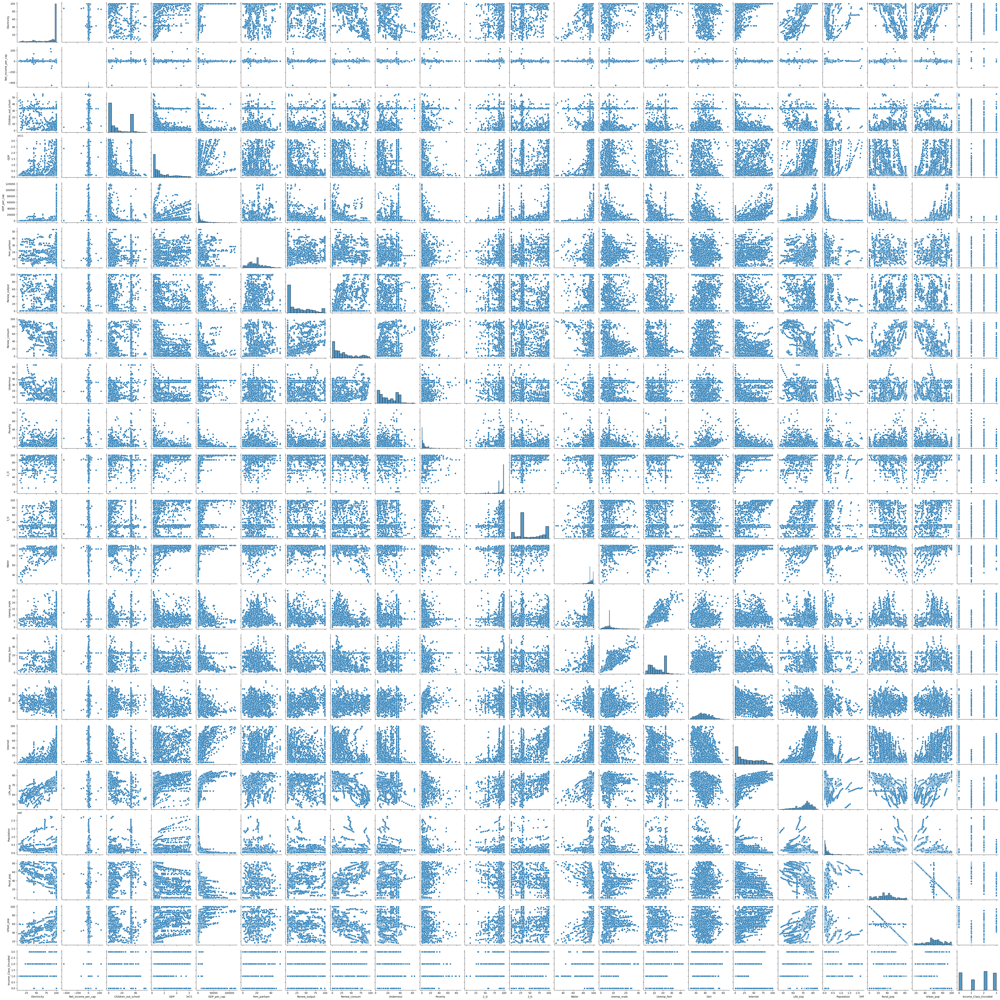

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure()

sns.pairplot(df_limpio[num_var.columns]) # ,hue = df_limpio['Continent'])# , hue_order =['Male', 'Female'])#,palette = 'plasma')

plt.show()

plt.savefig("Pairplot num var.png", dpi = 120)

### 4.8. Análisis considerando población rural/urbana
### **Objetivos a1) y a2)**

##### 4.8.1. Creación de variable categórica (Rural/Urbano)

In [ ]:
''' Agrego una nueva columna al dataframe 'df' que indique, a partir del porcentaje de poblacion rural,
si el pais es mayormente rural o urbano'''

df_limpio['rural_urban'] = np.where(df_limpio['Rural_pop'] >= 50, 'Rural', 'Urban')  #Si hay un porcentaje de poblacion rural igual o mayor al 50%, se considera 'Rural'

<ipython-input-29-935ba8a6114c>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_limpio['rural_urban'] = np.where(df_limpio['Rural_pop'] >= 50, 'Rural', 'Urban')  #Si hay un porcentaje de poblacion rural igual o mayor al 50%, se considera 'Rural'


In [ ]:
df_limpio['rural_urban'].value_counts()

Urban    1230
Rural     418
Name: rural_urban, dtype: int64

##### 4.8.2. Piechart mostrando composición de los datos

In [ ]:
# Establezco un codigo de colores para diferenciar urbano de rural

u_r_col = ['#607D8B', '#4CAF50']  # 1er color: urbano; 2do color: rural

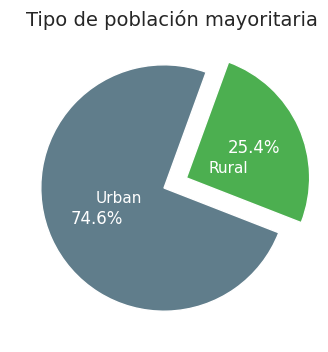

In [ ]:
sns.set(rc={'figure.figsize':(4,4)})
sns.set_theme(palette= u_r_col)

plt.pie(df_limpio['rural_urban'].value_counts(), labels = ('Urban', 'Rural'),
        labeldistance = 0.2,
        autopct = '%.1f%%', explode = (0, 0.2), startangle = 70,
        textprops=dict(color="w"))
plt.title("Tipo de población mayoritaria", fontsize = 14, loc = 'right')
plt.show()

El piechart muestra con claridad la predominancia de países mayoritariamente urbanos por sobre los principalmente rurales en la base de datos.

##### 4.8.3. Cantidad de poblaciones rurales/urbanas por región

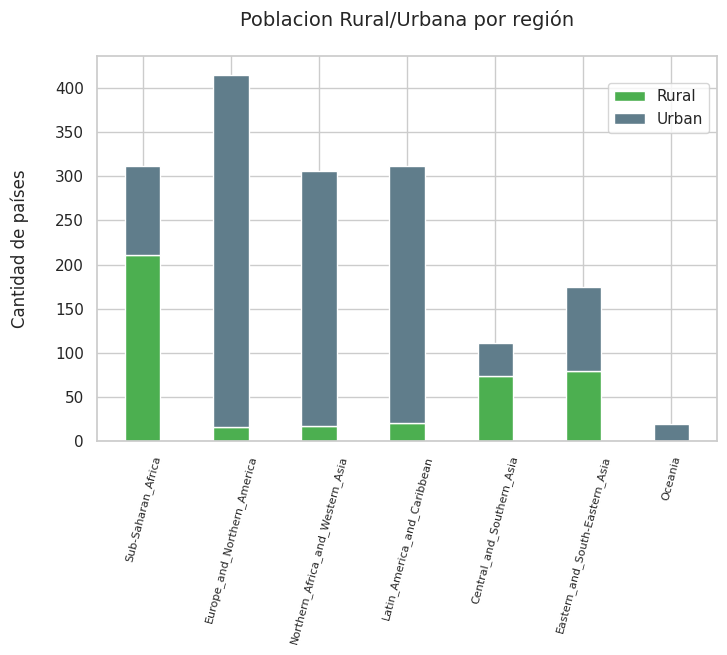

In [ ]:
sns.set(rc={'figure.figsize': (8, 5)})
sns.set_style(style = 'whitegrid')
sns.histplot(data=df_limpio, x='Region', hue='rural_urban', stat='count',
             multiple='stack', palette = u_r_col, alpha = 1, shrink = .4)
plt.legend(('Rural', 'Urban'), bbox_to_anchor=(1,.95))
plt.xticks(fontsize = 8, rotation = 75)
plt.xlabel('')
plt.ylabel('Cantidad de países\n')
plt.title('Poblacion Rural/Urbana por región\n', fontsize = 14)
plt.show()

- Este histograma nos muestra grandes contrastes entre regiones en relación a la cantidad de población rural y urbana de los países. La región de Europa y Norteamérica cuenta con la mayor cantidad de países con poblaciones urbanas, seguida por Latinoamérica y Caribe.
- Podemos observar que la región con más países principalmente rurales es África subsahariana, pero debemos tener en cuenta que si vemos en conjunto la cantidad de países urbanos de la región subsahariana y la del norte de África/Asia occidental, llegaríamos a la conclusión de que el continente africano cuenta con el mayor número de países urbanos después de Europa y Norteamérica.
- Oceanía no parece tener un número significativo de países rurales.
- Cabe destacar también que las regiones más rurales, además de África subsahariana, son aquellas del Centro/Sur de Asia y del Oriente asiático.


#####  4.8.4 Prevalencia de desnutrición en poblaciones rurales y urbanas

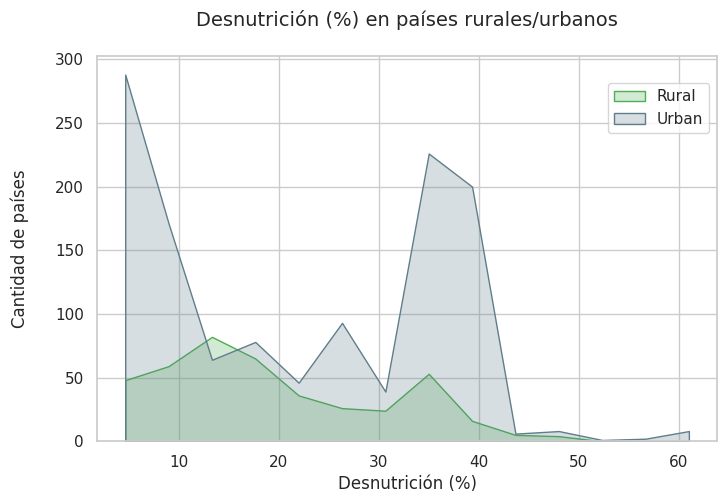

In [ ]:
sns.set(rc={'figure.figsize': (8, 5)})
sns.set_style(style='whitegrid')
sns.histplot(df_limpio, x="Undernour", hue="rural_urban", element="poly",stat = 'count', palette = u_r_col)
plt.legend(('Rural', 'Urban'), bbox_to_anchor=(1,.95))
# plt.xticks(fontsize = 8)
plt.xlabel('Desnutrición (%)')
plt.ylabel('Cantidad de países\n')
plt.title('Desnutrición (%) en países rurales/urbanos\n', fontsize = 14)
plt.show()

- Ambos tipos de países (rurales y urbanos) tienen sus mayores picos de frecuencia en valores extremos: porcentajes de desnutrición por debajo del 15% y por encima del 30%.
- Los países rurales tienen un pico inferior con porcentajes levemente más altos de desnutrición, pero esto se revierte en el extremo opuesto, ya que los países urbanos muestran un pico superior que abarca un rango desde el 35 al casi 40% de desnutrición.
-En ambos tipos de países, las mayores frecuencias se encuentran en los porcentajes más bajos de desnutrición.

Text(0.5, 1.0, 'Desnutrición (%) en poblaciones rurales/urbanas por región\n')

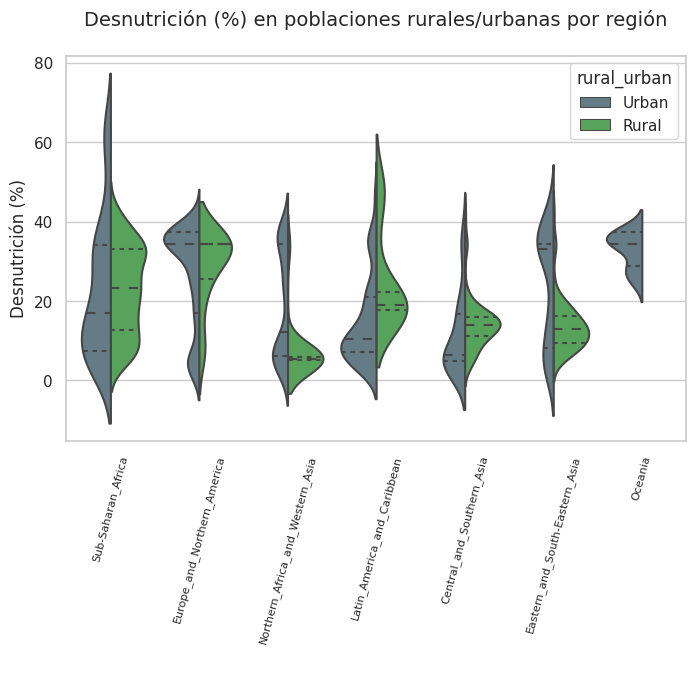

In [ ]:
sns.set(rc={'figure.figsize':(8,5)})
sns.set_style(style='whitegrid')
sns.violinplot(x='Region', y = 'Undernour', hue='rural_urban', data = df_limpio, split = True, inner = 'quartile', palette = u_r_col)
plt.ylabel('Desnutrición (%)')
plt.xlabel(' ')
plt.xticks(fontsize = 8, rotation = 75)
plt.title('Desnutrición (%) en poblaciones rurales/urbanas por región\n', fontsize = 14)

- Los países urbanos de África subsahariana exhiben el rango más amplio de porcentajes de prevalencia de la desnutrición del mundo, aunque su mediana se encuentra por debajo del 20%. Los países rurales de esta región, si bien muestran un rango menor de porcentajes, poseen una mediana más alta de desnutrición y una mayor frecuencia en porcentajes por encima del 20% de prevalencia de desnutrición.

- La región de Europa y Norteamérica sorprende al mostrar en países urbanos y rurales una mediana de prevalencia de desnutrición cercana al 40%, que es similar a la de la región oceánica (que no cuenta con los datos de Australia, que fueron tratados como outliers).

- Los países rurales del norte africano y de Asia occidental cuentan con la mediana más baja de prevalencia de desnutrición, y muestran poca diversidad en los valores, algo que se ve en la gran proximidad entre sus cuartiles. Los países urbanos de esta región tienen una mayor variación, aunque su mediana también es relativamente baja.

- Dentro de la región de Latinoamérica y el Caribe, vemos que hay una diferencia notable entre las medianas de prevalencia de desnutrición de países rurales y urbanos, siendo esta última aproximadamente 10% más baja que aquella de países rurales. Es posible notar una similitud en este sentido con la región Centro/Sur de Asia.

- Inversamente a lo expuesto en el punto previo, en la región de Asia oriental y suroriental hay también una diferencia destacable entre las medianas de países urbanos y rurales, aunque en este caso es mayor la mediana de países urbanos.

##### 4.8.5 Porcentaje de pobreza en poblaciones rurales y urbanas

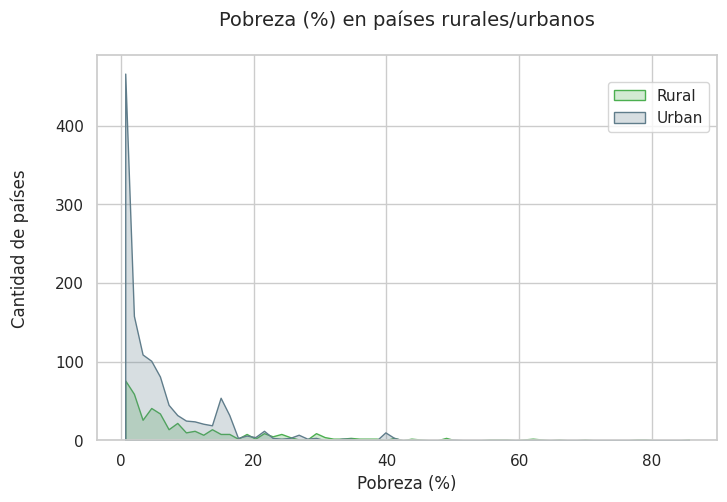

In [ ]:
sns.set(rc={'figure.figsize': (8, 5)})
sns.set_style(style='whitegrid')
sns.histplot(df_limpio, x="Poverty", hue="rural_urban", element="poly",stat = 'count', palette = u_r_col)
plt.legend(('Rural', 'Urban'), bbox_to_anchor=(1,.95))

# plt.xticks(fontsize = 8)
plt.xlabel('Pobreza (%)')
plt.ylabel('Cantidad de países\n')
plt.title('Pobreza (%) en países rurales/urbanos\n', fontsize = 14)
plt.show()

- La mayor parte de los países, sean urbanos o rurales, muestran bajos porcentajes de población que viven por menos de 1.90 USD diarios.

- En aproximadamente 50 casos de países mayoritariamente urbanos, poco menos del 20% de la población vive debajo de la línea de pobreza (1.90 USD/día).


Text(0.5, 1.0, 'Pobreza (%) en poblaciones rurales/urbanas por región\n')

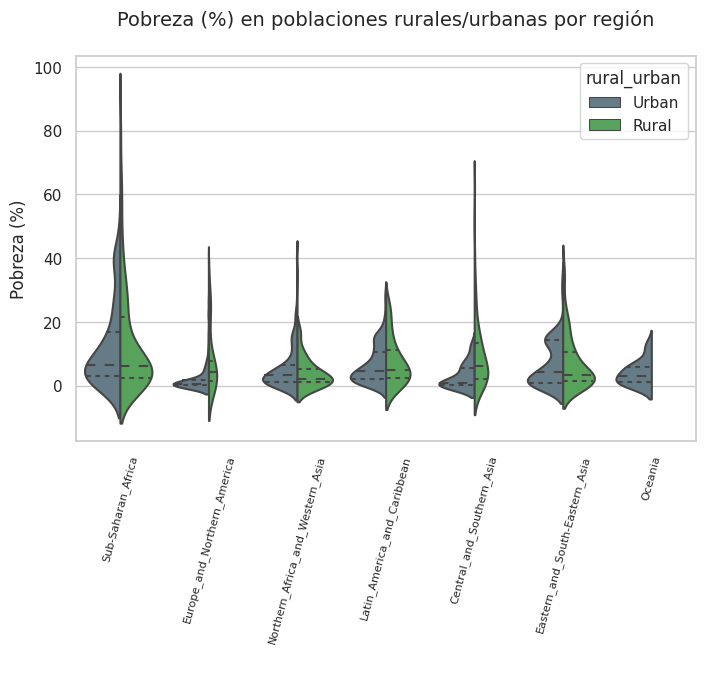

In [ ]:
sns.set(rc={'figure.figsize':(8,5)})
sns.set_style(style='whitegrid')
sns.violinplot(x='Region', y = 'Poverty', hue='rural_urban', data = df_limpio, split = True, inner = 'quartile', palette = u_r_col)
plt.ylabel('Pobreza (%)')
plt.xlabel(' ')
plt.xticks(fontsize = 8, rotation = 75)
plt.title('Pobreza (%) en poblaciones rurales/urbanas por región\n', fontsize = 14)

- En todas las regiones, el rango entre el **percentil 25** y el **percentil 75** se encuentra por debajo del 20% de pobreza.

- A diferencia de la prevalencia de desnutrición, respecto al porcentaje de población debajo de la línea de pobreza no parece haber distinciones significativas entre países mayoritariamente rurales y urbanos.

- Al igual que con la prevalencia de desnutrición, la mayor variación en los porcentajes de pobreza se registra entre los países urbanos de la región de África Subsahariana.

##### 4.8.6. Esperanza de vida en poblaciones rurales y urbanas

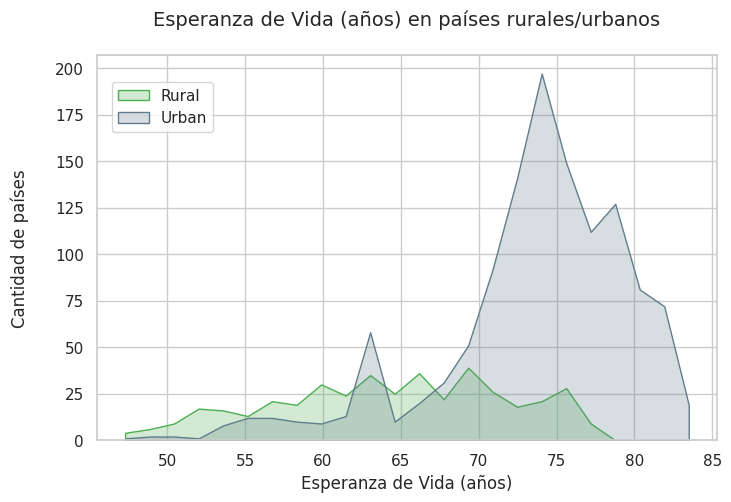

In [ ]:
sns.set(rc={'figure.figsize': (8, 5)})
sns.set_style(style='whitegrid')
sns.histplot(df_limpio, x="Life_exp", hue="rural_urban", element="poly",stat = 'count', palette = u_r_col)
plt.legend(('Rural', 'Urban'), bbox_to_anchor=(.2,.95))
# plt.xticks(fontsize = 8)
plt.xlabel('Esperanza de Vida (años)')
plt.ylabel('Cantidad de países\n')
plt.title('Esperanza de Vida (años) en países rurales/urbanos\n', fontsize = 14)
plt.show()

-  El histograma nos muestra que la mayor parte de los países principalmente urbanos tienen una esperanza de vida superior a los 70 años. Algunos de ellos llegando a superar los 80 años.

- Un pico más pequeño de países urbanos exhibe una esperanza de vida menor, entre los 60 y 65 años.

- La esperanza de vida en países mayormente rurales se encuentra repartida de manera más equitativa. Tiene un rango menor que aquel de los urbanos, ningún país rural llega a 80 años de esperanza de vida.

- A partir de este gráfico podríamos esbozar que la esperanza de vida es un aspecto que suele mejorar en países principalmente urbanos.

Text(0.5, 1.0, 'Esperanza de Vida (años) en poblaciones rurales/urbanas por región\n')

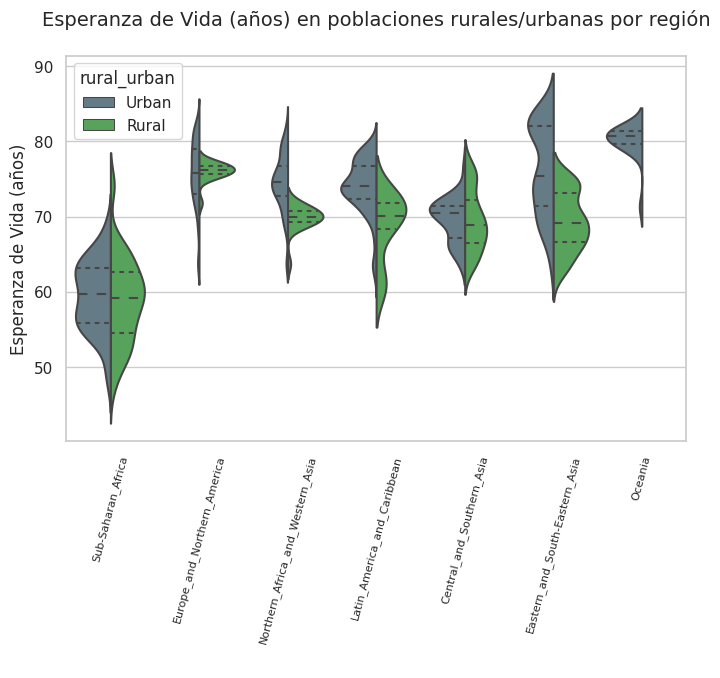

In [ ]:
sns.set(rc={'figure.figsize':(8,5)})
sns.set_style(style='whitegrid')
sns.violinplot(x='Region', y = 'Life_exp', hue='rural_urban', data = df_limpio, split = True, inner = 'quartile', palette = u_r_col)

plt.ylabel('Esperanza de Vida (años)')
plt.xlabel(' ')
plt.xticks(fontsize = 8, rotation = 75)
plt.title('Esperanza de Vida (años) en poblaciones rurales/urbanas por región\n', fontsize = 14)

- África subsahariana es la única región con una mediana de Esperanza de vida por debajo de los 60 años. Tiene un comportamiento muy similar en países urbanos y rurales.

- El resto de las regiones tiene la mayor parte de los países, sean urbanos o rurales, por encima de los 60 años de esperanza de vida.

- Con excepción de las regiones de África subsahariana y la de Europa y Norteamérica, en las que urbanos y rurales tienen mediana casi igual, en el resto de las regiones encontramos siempre una mayor mediana de esperanza de vida en países urbanos. Sin embargo, estos últimos además suelen tener un mayor rango de variación.

- Oceanía presenta los valores más altos de esperanza de vida, alrededor de los 80 años.


##### 4.8.7. Acceso a servicios (agua potable, electricidad, internet) en poblaciones rurales y urbanas

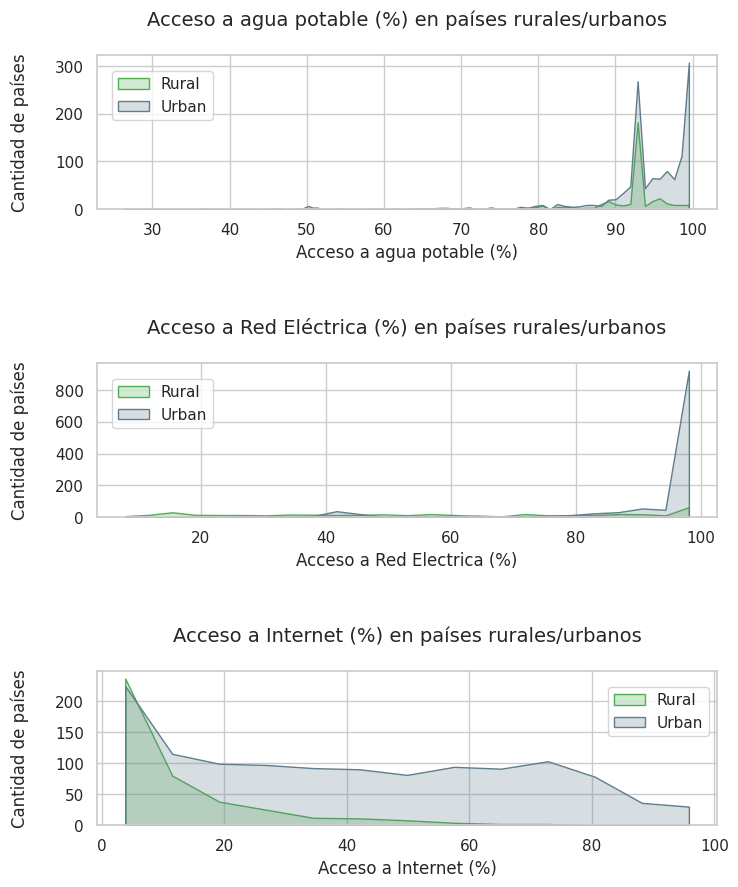

In [ ]:
fig, axes = plt.subplots(nrows=3, figsize=(8, 10))

# sns.set(rc={'figure.figsize': (8, 5)})
sns.set_style(style='whitegrid')

fig.subplots_adjust(hspace=1)

# Agua potable

sns.histplot(df_limpio, x="Water", hue="rural_urban", element="poly",stat = 'count', palette = u_r_col, ax = axes[0])

# plt.xticks(fontsize = 8)
axes[0].set_xlabel('Acceso a agua potable (%)')
axes[0].set_ylabel('Cantidad de países\n')
axes[0].set_title('Acceso a agua potable (%) en países rurales/urbanos\n', fontsize = 14)
axes[0].legend(('Rural', 'Urban'), bbox_to_anchor=(.2,.95))


# Electricidad
sns.histplot(df_limpio, x="Electricity", hue="rural_urban", element="poly",stat = 'count', palette = u_r_col, ax = axes[1])

# plt.xticks(fontsize = 8)
axes[1].set_xlabel('Acceso a Red Electrica (%)')
axes[1].set_ylabel('Cantidad de países\n')
axes[1].set_title('Acceso a Red Eléctrica (%) en países rurales/urbanos\n', fontsize = 14)
axes[1].legend(('Rural', 'Urban'), bbox_to_anchor=(.2,.95))

# Internet
sns.histplot(df_limpio, x="Internet", hue="rural_urban", element="poly",stat = 'count', palette = u_r_col, ax = axes[2])

# plt.xticks(fontsize = 8)
axes[2].set_xlabel('Acceso a Internet (%)')
axes[2].set_ylabel('Cantidad de países\n')
axes[2].set_title('Acceso a Internet (%) en países rurales/urbanos\n', fontsize = 14)
axes[2].legend(('Rural', 'Urban'), bbox_to_anchor=(1.0,.95))
plt.show()

**Acceso a agua potable**
- Como es de esperarse, la gran mayoría de los países principalmente urbanos tienen entre 90% y 100% de acceso a redes de agua potable.

- Si bien la mayor parte de los países principalmente rurales también tiene un porcentaje de acceso a agua potable por encima del 90%, esta submuestra exhibe un amplio rango de porcentajes. Algunos países principalmente rurales tienen hasta un porcentaje de 50% de acceso al agua potable, un valor muy bajo si lo leemos como que 1 de cada 2 personas no accede a ese servicio.

**Acceso a red eléctrica**
- Es destacable el hecho de que muy pocos países rurales tienen más del 80% de acceso a una red eléctrica. Algunos llegan a tener porcentajes de acceso a este servicio por debajo del 10%.

- Si bien hay países principalmentee urbanos con alrededor del 40% de acceso a la red eléctrica, la gran mayoría de estos alcanza casi un 100% de cobertura en su población.

**Acceso a Internet**
- El porcentaje de acceso a Internet en países de poblaciones rurales y urbanas es mayormente bajo, sobre todo en los primeros.
- Respecto exclusivamente a los países primordialmente urbanos, la submuestra parece medianamente equilibrada, con frecuencias similares en casi todos los porcentajes.

Text(0.5, 1.0, 'Acceso a agua potable (%) en poblaciones rurales/urbanas por región\n')

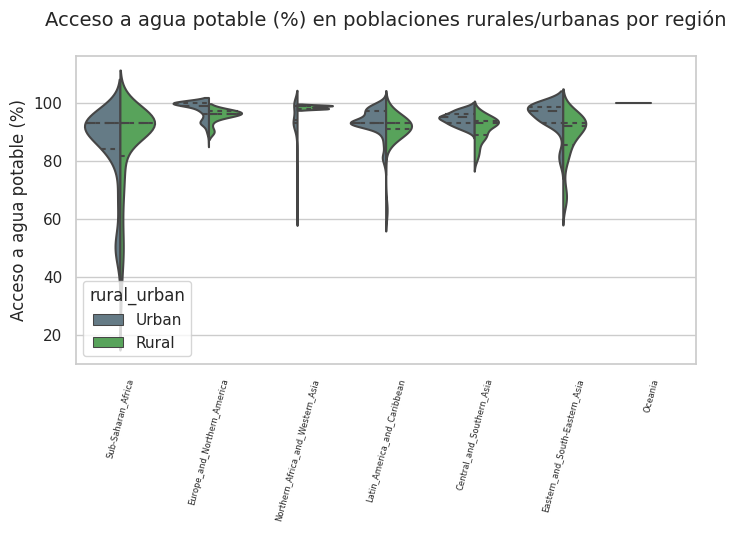

In [ ]:
sns.set(rc={'figure.figsize':(8,4)})
sns.set_style(style='whitegrid')
sns.violinplot(x='Region', y = 'Water', hue='rural_urban', data = df_limpio, split = True, inner = 'quartile', palette = u_r_col)

plt.ylabel('Acceso a agua potable (%)')
plt.xlabel(' ')
plt.xticks(fontsize = 6, rotation = 75)
plt.title('Acceso a agua potable (%) en poblaciones rurales/urbanas por región\n', fontsize = 14)

- Para todas las regiones, tanto en países urbanos como rurales, la mediana y los cuartiles Q1 y Q3 del porcentaje de acceso a agua potable se encuentran por encima del 80%.

- Para los casos muestreados, la región oceánica exhibe los mejores valores de acceso al agua potable.

- África subsahariana, Latinoamérica/Caribe, Norte de África/Occidente Asiático, y Asia Oriental/Suroriental (si bien presentan la mayor parte de los países por encima del 80% de acceso al agua) tiene los rangos más amplios de porcentaje. Esto se traduce en que algunos de sus países, en menor medida, alcanzan porcentajes más bajos de acceso. La región que más se destaca en este sentido es África subsahariana, que llega a tener porcentajes por debajo del 10% en poblaciones rurales e incluso urbanas.

Text(0.5, 1.0, 'Acceso a Red electrica (%) en poblaciones rurales/urbanas por región\n')

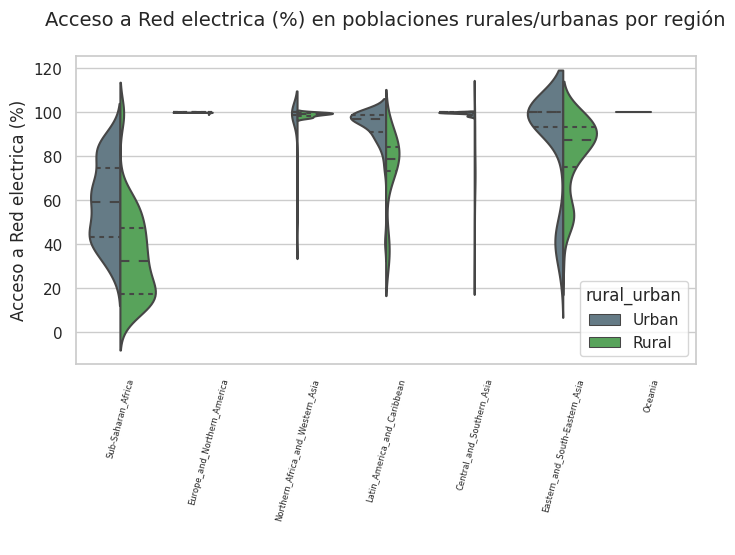

In [ ]:
sns.set(rc={'figure.figsize':(8,4)})
sns.set_style(style='whitegrid')
sns.violinplot(x='Region', y = 'Electricity', hue='rural_urban', data = df_limpio, split = True, inner = 'quartile', palette = u_r_col)

plt.ylabel('Acceso a Red electrica (%)')
plt.xlabel(' ')
plt.xticks(fontsize = 6, rotation = 75)
plt.title('Acceso a Red electrica (%) en poblaciones rurales/urbanas por región\n', fontsize = 14)

- En conjunción con su histograma correspondiente, vemos que en todas las regiones los países mayormente urbanos tienen mejor acceso a la electricidad que los rurales. Aunque esto se ve más emparejado en las regiones de Oceanía y Europa/Norteamérica.

- Los países rurales de África subsahariana muestran los porcentajes más bajos de acceso a la red eléctica.

- Los países principalmente urbanos del Centro y Sur de Asia tienen un acceso entre 90% y 100% a la electricidad. Pero presentan un gran contraste dentro de la misma región respecto a los países mayormente rurales, que llegan a tener porcentajes de acceso inferiores al 20%. Es curioso que para la región del Norte de África/Asia Occidental parece haber un patrón inverso, en el que la mayor parte de los países rurales alcanzan las mayores coberturas de electricidad y los países urbanos tienen un mayor rango de porcentajes de acceso a la red (algunos llegan a estar por debajo del 40%).

Text(0.5, 1.0, 'Acceso a Internet (%) en poblaciones rurales/urbanas por región\n')

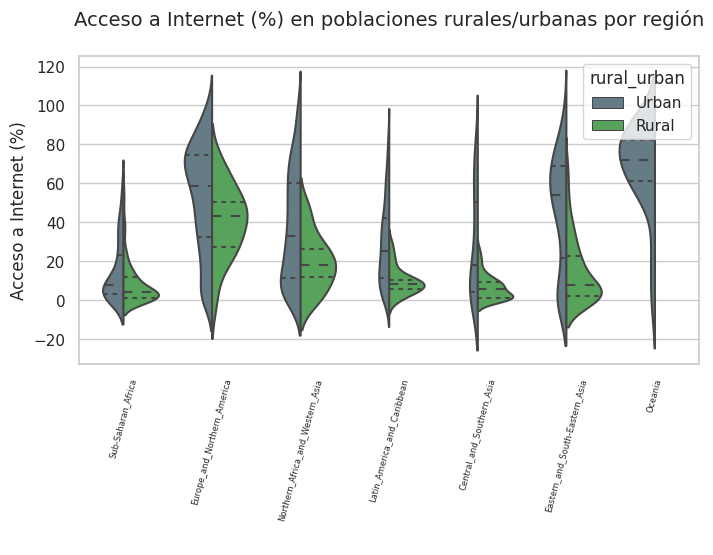

In [ ]:
sns.set(rc={'figure.figsize':(8,4)})
sns.set_style(style='whitegrid')
sns.violinplot(x='Region', y = 'Internet', hue='rural_urban', data = df_limpio, split = True, inner = 'quartile', palette = u_r_col)

plt.ylabel('Acceso a Internet (%)')
plt.xlabel(' ')
plt.xticks(fontsize = 6, rotation = 75)
plt.title('Acceso a Internet (%) en poblaciones rurales/urbanas por región\n', fontsize = 14)

- En todas las regiones vemos que el acceso a internet es mayor en países principalmente urbanos, a pesar de que en regiones como África subsahariana y Europa/Norteamérica la brecha con los países rurales es angosta. En el caso de la primera región ambos tipos de países tienen mayor frecuencia en porcentajes bajos de acceso a internet, mientras que en la segunda, estos son más altos.

- A excepción de la región oceánica, que muestra la mayor frecuencia de porcentajes cercanos al 80%, y de la región europeo/norteamericana en países urbanos, el resto de las regiones presentan mayores frecuencias en porcentajes relativamente bajos de acceso a la internet, sea en países rurales o urbanos.

### 4.9. Análisis Multivariados

##### 4.9.1. Heatmap - Correlación entre variables

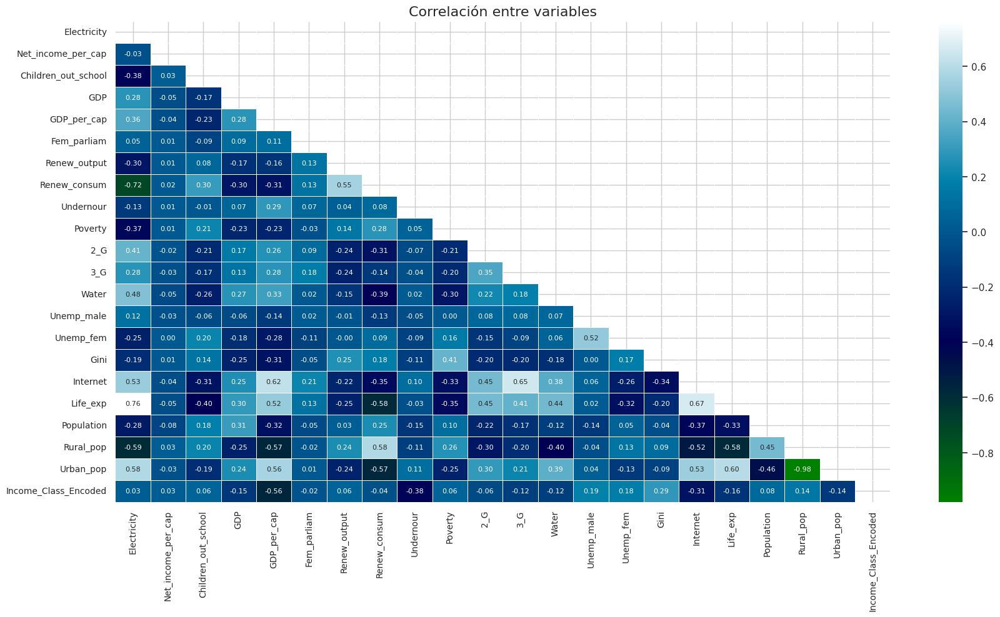

In [ ]:
#Preparo mascara para graficar un heatmap sin repeticion de datos

mask = np.zeros_like(num_var.corr())
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices] = True

# Ploteo heatmap con mascara de datos
f, ax = plt.subplots(figsize=(20,10))
sns.set_style(style = 'white')
sns.heatmap(num_var.corr(), annot = True, annot_kws = {"size": 8}, mask = mask,  linewidth=0.4, fmt='.2f', cmap = 'ocean', ax=ax)
plt.title('Correlación entre variables', fontsize = 16)
plt.yticks(rotation = 0, fontsize = 10)
plt.xticks(rotation = 90, fontsize = 10)

# plt.savefig('Heatmap num_var.png', dpi = 150)
plt.show()

**Combinaciones de variables con un Coeficiente de Correlación superior o igual a 0.6:**

|Corr Coef|Variable 1| Variable 2|
|:----:|:--------------------:|:--------------------:|
|-0.98|Urban_pop|Rural_pop|
|0.76|Life_exp|Electricity|
|-0.72|Renew_consum|Electricity|
|0.67|Life_exp|Internet|
|0.65|Internet|3_G|
|0.62|Internet|GDP_per_cap|
|0.60|Urban_pop|Life_exp|


Vemos a continuación cómo se relacionan estas variables. Algunas de las correlaciones, como aquella entre el porcentaje de población rural (Rural_pop) y el porcentaje de población urbana (Urban_pop), pueden ser redundantes. En este caso en particular, esto tendría sentido dado que si una población no es rural, entonces es urbana, el crecimiento/decrecimiento de una modifica obligatoriamente a la otra en la misma medida.

Plotearemos además una codificación de la clase de ingreso (Income_Class_Encoded) en colores, para ver cómo se distribuyen respecto a cada variable.

<Figure size 800x400 with 0 Axes>

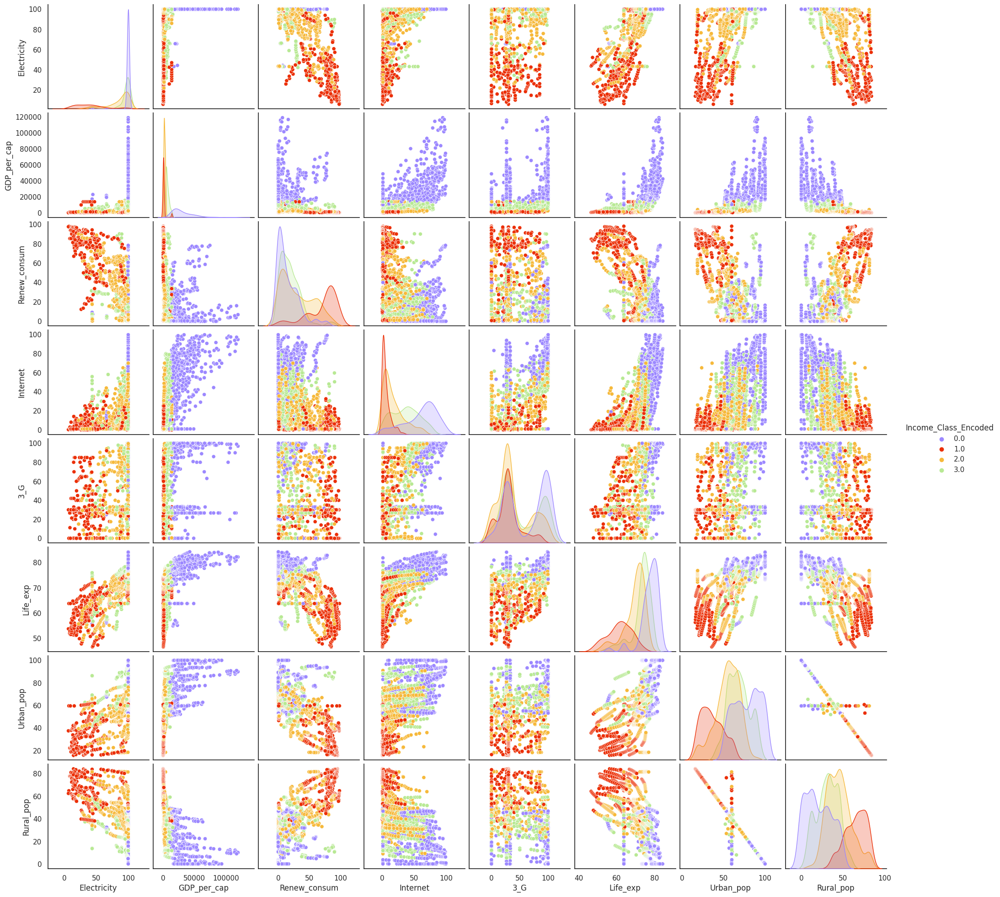

In [ ]:
# Diccionario de colores de Income Class
inc_color = {
    0.0:"#9c88ff", # Alto ingreso
    1.0:"#eb2f06", # Bajo ingreso
    2.0:"#f6b93b", # Medio-bajo ingreso
    3.0:"#b8e994"  # Medio-alto ingreso
}


plt.figure()

sns.pairplot(df_limpio[['Electricity', 'GDP_per_cap', 'Renew_consum', 'Internet', '3_G', 'Life_exp', 'Urban_pop', 'Rural_pop','Income_Class_Encoded']], hue = 'Income_Class_Encoded',
             palette = inc_color)

- A partir del pairplot podemos confirmar que "Rural_pop" y "Urban_pop" se comportan de manera especular. Por lo que más adelante se deberá analizar la eliminación de una de las dos variables.

- Para el resto de las variables analizadas, parecen corresponderse gráficamente con los coeficientes de correlación obtenidos en el Heatmap. Por lo que sería interesante seguir utilizándolas en análisis posteriores.

**A pesar de lo expuesto, realizaré un Análisis de Componentes Principales para ver a partir de los eigenvalues (o autovalores) y eigenvectors (o autovectores) qué variables podrían explicar la varianza de cada componente y en qué proporción.**

##### 4.9.2. Análisis de Componentes Principales (PCA)

Realizado sobre el total de variables numéricas (num_var)

In [ ]:
num_var.columns

Index(['Electricity', 'Net_income_per_cap', 'Children_out_school', 'GDP',
       'GDP_per_cap', 'Fem_parliam', 'Renew_output', 'Renew_consum',
       'Undernour', 'Poverty', '2_G', '3_G', 'Water', 'Unemp_male',
       'Unemp_fem', 'Gini', 'Internet', 'Life_exp', 'Population', 'Rural_pop',
       'Urban_pop', 'Income_Class_Encoded'],
      dtype='object')

In [ ]:
#Estandarizo con logaritmo a las features
num_var_scaled = pd.DataFrame(StandardScaler().fit_transform(num_var),
                              columns = ['Electricity', 'Net_income_per_cap', 'Children_out_school', 'GDP',
                                         'GDP_per_cap', 'Fem_parliam', 'Renew_output', 'Renew_consum',
                                         'Undernour', 'Poverty', '2_G', '3_G', 'Water', 'Unemp_male',
                                         'Unemp_fem', 'Gini', 'Internet', 'Life_exp', 'Population', 'Rural_pop',
                                         'Urban_pop', 'Income_Class_Encoded'],
                              index = num_var.index)

print("Scaled numeric variables shape: ", num_var_scaled.shape, '\n')

Scaled numeric variables shape:  (1648, 22) 



In [ ]:
# Corrijo Income Class que no debe cambiar con la estandarizacion
del num_var_scaled['Income_Class_Encoded']
num_var_scaled.columns

Index(['Electricity', 'Net_income_per_cap', 'Children_out_school', 'GDP',
       'GDP_per_cap', 'Fem_parliam', 'Renew_output', 'Renew_consum',
       'Undernour', 'Poverty', '2_G', '3_G', 'Water', 'Unemp_male',
       'Unemp_fem', 'Gini', 'Internet', 'Life_exp', 'Population', 'Rural_pop',
       'Urban_pop'],
      dtype='object')

In [ ]:
# Vuelvo a agregar la version correcta de la variable
num_var_scaled['Income_Class_Encoded'] = num_var['Income_Class_Encoded']
num_var_scaled.head(2)

,Electricity,Net_income_per_cap,Children_out_school,GDP,GDP_per_cap,Fem_parliam,Renew_output,Renew_consum,Undernour,Poverty,...,Water,Unemp_male,Unemp_fem,Gini,Internet,Life_exp,Population,Rural_pop,Urban_pop,Income_Class_Encoded
21,-2.242064,2.184115,1.536214,-0.838689,-0.654021,-0.321705,1.194167,1.440294,3.212538,-0.527629,...,0.014082,-0.188514,1.095359,-0.844490,-1.135885,-3.080542,-0.142471,0.455750,-0.455594,1.0
22,-2.199819,0.202593,1.316165,-0.807539,-0.647623,-0.321705,1.112527,1.253733,2.871870,0.927308,...,0.014082,-0.188514,1.095359,0.297945,-1.132322,-2.983918,-0.123731,0.398516,-0.397161,1.0


In [ ]:
# Calculo los dos primeros componentes principales

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(num_var_scaled)
principalDf = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2'],
                           index = num_var_scaled.index)

#Agrego Income_Class_Encoded al nuevo DF que incluye PC1 y PC2
principalDf['Income_Class_Encoded'] = num_var_scaled['Income_Class_Encoded']
print(principalDf.head(3))
print(f"Principal Components dataframe shape is: {principalDf.shape}")

         PC1       PC2  Income_Class_Encoded
21  3.855610  2.496324                   1.0
22  3.703614  1.938220                   1.0
23  5.300383  0.764473                   2.0
Principal Components dataframe shape is: (1648, 3)


_EIGENVALUES Y EIGENVECTORS_

In [ ]:
# Obtengo los Eigenvalues y Eigenvectores
eigenvalues = pca.explained_variance_ratio_
eigenvectors = pca.components_
print(f"Eigenvalues:\n PC1: {eigenvalues[0]} \n PC2: {eigenvalues[1]} \n")

Eigenvalues:
 PC1: 0.28233323264200294 
 PC2: 0.10223375181523688 



- Los dos primeros componentes principales calculados (PC1 y PC2) tienen en suma un porcentaje de varianza explicada bajo (poco más del 38%). Es decir que la varianza se encuentra distribuida a lo largo de varios componentes principales.

In [ ]:
# Realizo un dataframe con los eigenvectors obtenidos

e_vectors = pd.DataFrame(eigenvectors, columns = ['Electricity', 'Net_income_per_cap', 'Children_out_school', 'GDP',
                                         'GDP_per_cap', 'Fem_parliam', 'Renew_output', 'Renew_consum',
                                         'Undernour', 'Poverty', '2_G', '3_G', 'Water', 'Unemp_male',
                                         'Unemp_fem', 'Gini', 'Internet', 'Life_exp', 'Population', 'Rural_pop',
                                         'Urban_pop', 'Income_Class_Encoded'])
e_vectors = e_vectors.rename(index={0: 'PC1', 1: 'PC2'})
e_vectors.T


,PC1,PC2
Electricity,-0.314235,-0.225488
Net_income_per_cap,0.020026,-0.004127
Children_out_school,0.175147,0.042045
GDP,-0.158019,0.087966
GDP_per_cap,-0.282261,0.299885
Fem_parliam,-0.044986,0.121326
Renew_output,0.157705,0.131545
Renew_consum,0.276164,0.273223
Undernour,-0.038804,0.365184
Poverty,0.187272,0.014214


A partir de los valores de los eigenvectores, podríamos inferir que las variables que más aportan a la varianza de cada componente son:

**PC1:** Esperanza de vida, Internet, Electricidad, Pob. Rural/Urbana, PBI per cápita, Consumo de energía renovable.

--------------------------------------------------------------------------------

**PC2:** Desnutrición, Desempleo masculino, PBI per cápita, Desempleo femenino, Consumo de energía renovable.



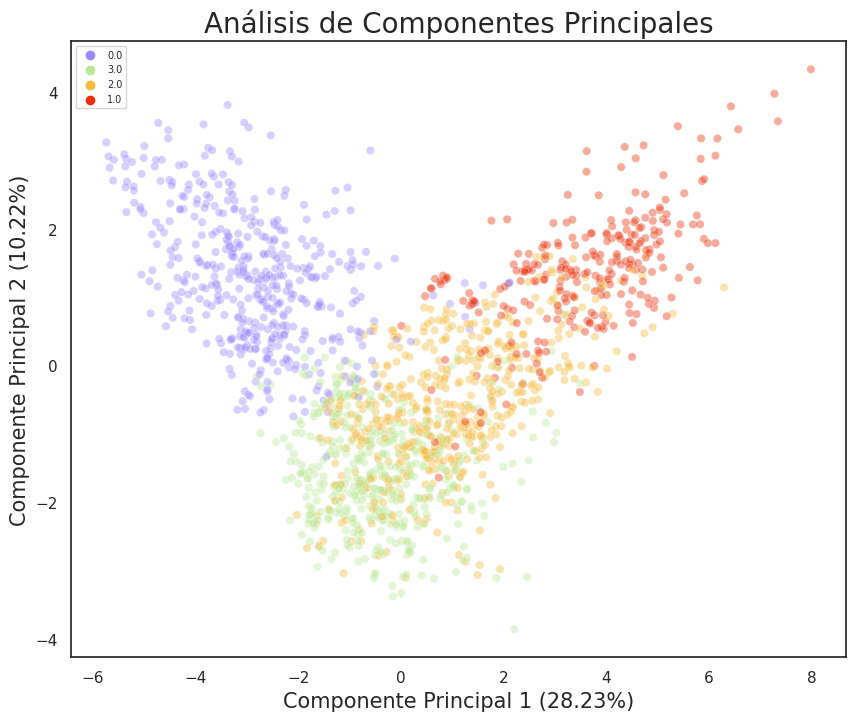

In [ ]:
# Establezco orden del hue
hue_order = [0.0, 3.0, 2.0, 1.0]


# Creo scatterplot
plt.figure(figsize = (10, 8))
sc = sns.scatterplot(data = principalDf,
                x= principalComponents[:,0],
                y= principalComponents[:,1],
                hue='Income_Class_Encoded',
                hue_order = hue_order,
                palette = inc_color,
                alpha = 0.4)

sc.set_xlabel('Componente Principal 1 (28.23%)', fontsize=15)
sc.set_ylabel('Componente Principal 2 (10.22%)', fontsize=15)
sc.set_title('Análisis de Componentes Principales', fontsize=20)
sc.legend(fontsize = 7)

plt.show()

**Recordatorio**
- **0.0 = Ingreso Alto (High Income)** -> Lila

- **1.0 = Ingreso Bajo (Low Income)** -> Rojo

- **2.0 = Ingreso Medio-Bajo (Lower-middle Income)** -> Naranja

- **3.0 = Ingreso Medio-Alto (Upper-middle Income)** -> Verde

- Al volcar en un gráfico de dispersión los dos primeros componentes principales utilizando colores para distinguir cada clase de ingreso económico (Income class), vemos que es posible diferenciar distintos espacios para cada clase, aunque esta diferenciación no es perfecta. A pesar de esto último, sería un buen indicador de que las variables analizadas podrían servir para la creación de un modelo de clasificación de clases de ingreso, uno de los objetivos del presente proyecto.

- Hacia la izquierda del gráfico, el extremo negativo de PC1, se ubican los casos con mayor esperanza de vida, mayor población urbana, mayor porcentaje de acceso a internet y PBI per cápita más alto. Esto a su vez se corresponde con los casos de clase de ingreso económico alto.

- Hacia el extremo opuesto, el positivo de PC1, se encuentran, los casos inversos: casos de países rurales, con menor esperanza de vida y acceso a internet, PBI per cápita más bajo, pero a su vez, un mayor consumo de energías renovables. Esto último tiene sentido al considerar que es menor el acceso a redes eléctricas. Estos casos se corresponden con aquellos de ingreso económico bajo.

A partir de este gráfico, además, vemos que es mejor la separación entre clases de ingreso económico a lo largo del PC1, y no tanto del PC2, donde se entremezclan las clases en mayor medida.


A continuación, teniendo en cuenta lo visto en la sección de exploración de los datos y análisis univariados, bivariados y multivariados, analizaré qué variables serán las más adecuadas para su conservación, su transformación o su elimnación.

## **5- Ingeniería y Selección de Atributos**

### 5.1. Eliminación de variables con menor influencia en la variación

A partir de lo discutido en la sección 4, algunas variables de la base de datos pueden ser dejadas de lado.
En principio, hay dos variables que actúan de forma especular: el porcentaje de poblaciones urbanas (`Urban_pop`) y el porcentaje de poblaciones rurales (`Rural_pop`). Utilizar ambas en simultáneo puede resultar en una redundancia, por lo tanto **eliminaré la variable** `Urban_pop`.
De acuerdo a los objetivos planteados en este proyecto (en especial el objetivo b2) la variable `Rural_pop` es necesaria, e inicialmente `Urban_pop` contaba con un mayor número de casos nulos. Esto significa que al inicio fue necesario realizar una imputación de datos más numerosa que con `Rural_pop`.


In [ ]:
df_selected = df_limpio.drop('Urban_pop', axis = 1, inplace = False)

In [ ]:
num_var_selected = num_var.drop('Urban_pop', axis = 1, inplace = False)
num_var_selected.columns

Index(['Electricity', 'Net_income_per_cap', 'Children_out_school', 'GDP',
       'GDP_per_cap', 'Fem_parliam', 'Renew_output', 'Renew_consum',
       'Undernour', 'Poverty', '2_G', '3_G', 'Water', 'Unemp_male',
       'Unemp_fem', 'Gini', 'Internet', 'Life_exp', 'Population', 'Rural_pop',
       'Income_Class_Encoded'],
      dtype='object')

Elimino variables que no son relevantes para los objetivos de este proyecto, tuvieron muy bajo coeficiente de correlación con el resto de las variables y/o no influyeron en la varianza de los componentes principales.

In [ ]:
df_selected.drop(['Net_income_per_cap', 'Children_out_school', 'GDP', 'Renew_output', 'Poverty', '2_G', '3_G', 'Unemp_male', 'Gini', 'Population'], axis = 1, inplace = True)
print(df_selected.shape, df_selected.columns)

(1648, 16) Index(['Year', 'Electricity', 'GDP_per_cap', 'Fem_parliam', 'Renew_consum',
       'Undernour', 'Water', 'Unemp_fem', 'Internet', 'Life_exp', 'Rural_pop',
       'Income_Class_Encoded', 'Continent', 'Region', 'Country',
       'rural_urban'],
      dtype='object')


In [ ]:
num_var_selected.drop(['Net_income_per_cap', 'Children_out_school', 'GDP', 'Renew_output', 'Poverty', '2_G', '3_G', 'Unemp_male', 'Gini', 'Population'], axis = 1, inplace = True)
print(num_var_selected.shape, num_var_selected.columns)

(1648, 11) Index(['Electricity', 'GDP_per_cap', 'Fem_parliam', 'Renew_consum',
       'Undernour', 'Water', 'Unemp_fem', 'Internet', 'Life_exp', 'Rural_pop',
       'Income_Class_Encoded'],
      dtype='object')


### 5.2. Importancia de Variables con Random Forest:
#### Basada en Feature Permutation

In [ ]:
# Uso variables numericas
x_permut = num_var_selected.iloc[:,:10]
y_permut = num_var_selected.iloc[:,10] # Tomo a Income_Class_Encoded como target
print(f"Dimensiones x_permut: {x_permut.shape} \n Dimensiones y_permut: {len(y_permut)} \n")
print(x_permut.columns)
print(y_permut)

Dimensiones x_permut: (1648, 10) 
 Dimensiones y_permut: 1648 

Index(['Electricity', 'GDP_per_cap', 'Fem_parliam', 'Renew_consum',
       'Undernour', 'Water', 'Unemp_fem', 'Internet', 'Life_exp', 'Rural_pop'],
      dtype='object')
21      1.0
22      1.0
23      2.0
24      2.0
25      2.0
       ... 
3282    1.0
3283    1.0
3284    1.0
3285    1.0
3286    1.0
Name: Income_Class_Encoded, Length: 1648, dtype: float64


In [ ]:
y_permut = y_permut.astype('int') # Convierto mi target a tipo 'int'
y_permut

21      1
22      1
23      2
24      2
25      2
       ..
3282    1
3283    1
3284    1
3285    1
3286    1
Name: Income_Class_Encoded, Length: 1648, dtype: int64

Division de submuestra en entrenamiento (train) y test para entrenar el modelo de Random Forest que utilizare en la seleccion de variables

In [ ]:
x_permut_train, x_permut_test, y_permut_train, y_permut_test = train_test_split(x_permut, y_permut, test_size = 0.2, random_state = 42)

In [ ]:
feature_names = x_permut_train.columns

Entrenamiento de modelo de Random Forest.

Será el estimador para usar Permutation Importance

In [ ]:
forest = RandomForestClassifier(random_state=0)
forest.fit(x_permut_train, y_permut_train)

RandomForestClassifier(random_state=0)

Feature Permutation

In [ ]:
result = permutation_importance(forest, x_permut_test, y_permut_test, n_repeats = 15, random_state = 42)

forest_importances = pd.Series(result.importances_mean, index = feature_names)

Visualizo la media de disminucion de precision de cada variable

In [ ]:
forest_importances

Electricity     0.028081
GDP_per_cap     0.503838
Fem_parliam    -0.000808
Renew_consum   -0.001010
Undernour       0.003636
Water           0.004040
Unemp_fem      -0.002626
Internet        0.008889
Life_exp        0.010101
Rural_pop       0.074949
dtype: float64

- El **PBI per cápita** tiene una media de disminución de la precision mucho mayor que la del resto de las variables. Esto significa que al permutarla, la precisión del modelo de Random Forest disminuye mucho, por lo tanto se la considera de importancia.

- Pareciera que la diferencia con el resto de las variables es muy grande, y esto acaba invisibilizando la variación del resto. Dado esto, repetiré el proceso apartando **PBI per cápita (`GDP_per_cap`) ya como variable importante** .


In [ ]:
x_permut2 = x_permut.drop('GDP_per_cap', axis = 1, inplace = False)
print(x_permut2.columns)
print(x_permut2.shape)

Index(['Electricity', 'Fem_parliam', 'Renew_consum', 'Undernour', 'Water',
       'Unemp_fem', 'Internet', 'Life_exp', 'Rural_pop'],
      dtype='object')
(1648, 9)


In [ ]:
x_permut_train2, x_permut_test2, y_permut_train2, y_permut_test2 = train_test_split(x_permut2, y_permut, test_size = 0.2, random_state = 42)
feature_names2 = x_permut_train2.columns

forest = RandomForestClassifier(random_state=0)
forest.fit(x_permut_train2, y_permut_train2)

RandomForestClassifier(random_state=0)

In [ ]:
result2 = permutation_importance(forest, x_permut_test2, y_permut_test2, n_repeats = 15, random_state = 42)

forest_importances2 = pd.Series(result2.importances_mean, index = feature_names2)

In [ ]:
forest_importances2

Electricity     0.184242
Fem_parliam     0.017980
Renew_consum    0.064444
Undernour       0.025051
Water           0.010505
Unemp_fem       0.008081
Internet        0.050505
Life_exp        0.128485
Rural_pop       0.207677
dtype: float64

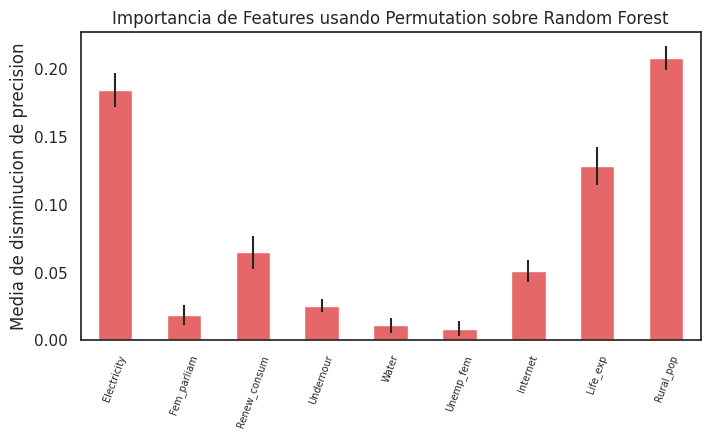

In [ ]:
fig, ax = plt.subplots(figsize = (8, 4))

forest_importances2.plot.bar(yerr=result2.importances_std, color = '#e66767', ax=ax)
ax.set_title("Importancia de Features usando Permutation sobre Random Forest")
ax.set_ylabel("Media de disminucion de precision")
plt.xticks(rotation = 70, fontsize = 7)

# fig.tight_layout()

plt.show()

A partir de este segundo proceso de permutación, queda en evidencia que las variables con mayor importancia son `Rural_pop`, `Electricity`, `Life_exp`, `Renew_consum` e `Internet`. En menor medida, `Undernour` y `Fem_parliam`.

### 5.3. Resumen de variables seleccionadas

A partir del proceso de Feature Selection llevado a cabo en esta sección, seleccioné las siguientes variables:

- PBI per cápita `GDP_per_cap`

- Porcentaje de Población Rural `Rural_pop`

- Porcentaje de acceso a Red Eléctrica `Electricity`

- Esperanza de Vida `Life_exp`

- Porcentaje de Energía Renovable consumida `Renew_consum`

- Porcentaje de acceso a Internet `Internet`


Por otro lado, para continuar con los objetivos planteados en la sección 2 del presente proyecto, usaré por separado las variables:

- Porcentaje de participación femenina en parlamentos `Fem_parliam`

- Porcentaje de desempleo femenino `Unemp_fem`


A estas, por supuesto, agregaré finalmente mi variable target:

- Clase de Ingreso Económico `Income_Class_Encoded`

In [ ]:
df_selected.columns

Index(['Year', 'Electricity', 'GDP_per_cap', 'Fem_parliam', 'Renew_consum',
       'Undernour', 'Water', 'Unemp_fem', 'Internet', 'Life_exp', 'Rural_pop',
       'Income_Class_Encoded', 'Continent', 'Region', 'Country',
       'rural_urban'],
      dtype='object')

In [ ]:
df_selected.drop(['Undernour', 'Water', 'rural_urban'], axis = 1, inplace = True)
df_selected.columns

<bound method DataFrame.drop of       Year  Electricity  GDP_per_cap  Fem_parliam  Renew_consum  Unemp_fem  \
21    2002    26.383869   872.494442    15.454545     70.420998  22.833333   
22    2003    27.465635   982.961008    15.454545     65.140404  22.833333   
23    2004    28.536760  1255.564513    15.000000     61.915699  26.100000   
24    2005    29.596224  1902.422150    15.000000     68.378304  22.833333   
25    2006    30.646555  2599.565948    15.000000     62.127300  22.833333   
...    ...          ...          ...          ...           ...        ...   
3282  2014    32.300000  1434.896277    31.481481     80.775002   5.200000   
3283  2015    33.700000  1445.069702    31.481481     81.427200  22.833333   
3284  2016    39.676228  1464.588957    31.481481     82.792603  22.833333   
3285  2017    40.144283  1335.665064    32.575758     83.492996  22.833333   
3286  2018    40.616360  1352.162653    31.481481     81.363602  22.833333   

       Internet  Life_exp  Rura

In [ ]:
num_var_selected.columns

Index(['Electricity', 'GDP_per_cap', 'Fem_parliam', 'Renew_consum',
       'Undernour', 'Water', 'Unemp_fem', 'Internet', 'Life_exp', 'Rural_pop',
       'Income_Class_Encoded'],
      dtype='object')

In [ ]:
num_var_selected.drop(['Undernour', 'Water'], axis = 1, inplace = True)
print(num_var_selected.shape)
print(num_var_selected.columns)

(1648, 9)
Index(['Electricity', 'GDP_per_cap', 'Fem_parliam', 'Renew_consum',
       'Unemp_fem', 'Internet', 'Life_exp', 'Rural_pop',
       'Income_Class_Encoded'],
      dtype='object')


In [ ]:
df_selected_important = df_selected.drop(['Fem_parliam', 'Unemp_fem'], axis = 1, inplace = False)
df_selected_important.columns

Index(['Year', 'Electricity', 'GDP_per_cap', 'Renew_consum', 'Internet',
       'Life_exp', 'Rural_pop', 'Income_Class_Encoded', 'Continent', 'Region',
       'Country'],
      dtype='object')

In [ ]:
num_var_important = num_var_selected.drop(['Fem_parliam', 'Unemp_fem'], axis = 1, inplace = False)
num_var_important.columns

Index(['Electricity', 'GDP_per_cap', 'Renew_consum', 'Internet', 'Life_exp',
       'Rural_pop', 'Income_Class_Encoded'],
      dtype='object')

## 6- **Resolución Objetivo b1)**.

_Examinar cuál es la tendencia de la participación política femenina de cada región, y si esta se asocia con el porcentaje de desempleo femenino._

### 6.1. Definición de función para estimar la media de una variable por año y región

In [ ]:
# Lista de nombres de region

region_list = df_selected_important['Region'].unique().tolist()
region_list

['Sub-Saharan_Africa',
 'Europe_and_Northern_America',
 'Northern_Africa_and_Western_Asia',
 'Latin_America_and_Caribbean',
 'Central_and_Southern_Asia',
 'Eastern_and_South-Eastern_Asia',
 'Oceania']

In [ ]:
# Lista de colores por region

ssafricol = '#A3CB38' # Verde claro
euronacol = '#833471' # Violeta
nafwascol = '#EA2027' # Rojo
latamcol = '#009432' # Verde oscuro
censuacol = '#FFC312' # Naranja claro
eseacol = '#0652DD' # Azul oscuro
oceancol = '#12CBC4' # Turquesa

In [ ]:
def media_var_region(datos, var, regiones):
    '''datos: dataframe entero,
    var: nombre de variable de interes entre '',
    continentes: lista de regiones de interes, ej. ['a','b','c',...,'n']'''

    medias = {}
    for region in regiones:
        # Obtener los datos para la region
        region_datos = datos[datos['Region'] == region]
        # Obtener los años únicos en los datos de la region
        years = np.unique(region_datos['Year'])
        # Crear un diccionario para almacenar las medias por año
        medias_region = {}
        for year in years:
            # Obtener los datos para el año
            ano_datos = region_datos[region_datos['Year'] == year]
            # Calcular la media para la variable de interés
            media_ano = np.mean(ano_datos[var])
            # Almacenar la media en el diccionario
            medias_region[year] = media_ano
        # Almacenar el diccionario para la region
        medias[region] = medias_region
    return medias

### 6.2. Tendencia de participación femenina en parlamentos por región (2000-2018)

Calculo media anual por region

In [ ]:
fem_par_means = media_var_region(df_selected, 'Fem_parliam', region_list)

In [ ]:
# fem_par_means

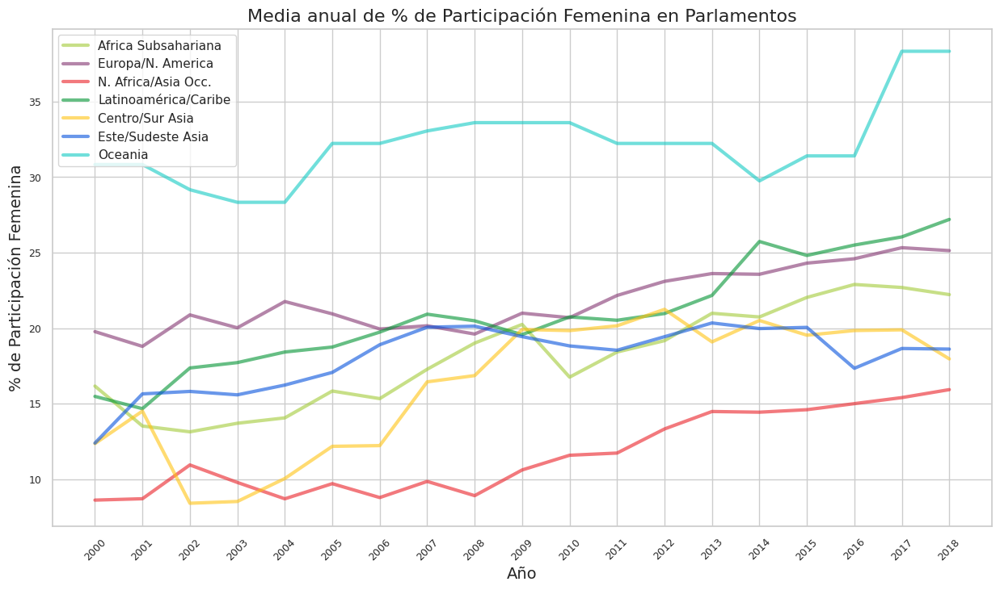

In [ ]:
# Gráfico de medias anuales de % de Participacion Femenina en Parlamentos

fig, ax = plt.subplots(figsize = (15,8))


plt.plot(range(len(fem_par_means['Sub-Saharan_Africa'])), list(fem_par_means['Sub-Saharan_Africa'].values()), color = ssafricol, linewidth = 3, alpha = 0.6, label = 'Africa Subsahariana')
plt.plot(range(len(fem_par_means['Europe_and_Northern_America'])), list(fem_par_means['Europe_and_Northern_America'].values()), color = euronacol, linewidth = 3, alpha = 0.6, label = 'Europa/N. America')
plt.plot(range(len(fem_par_means['Northern_Africa_and_Western_Asia'])), list(fem_par_means['Northern_Africa_and_Western_Asia'].values()), color = nafwascol, linewidth = 3, alpha = 0.6, label = 'N. Africa/Asia Occ.')
plt.plot(range(len(fem_par_means['Latin_America_and_Caribbean'])), list(fem_par_means['Latin_America_and_Caribbean'].values()), color = latamcol, linewidth = 3, alpha = 0.6, label = 'Latinoamérica/Caribe')
plt.plot(range(len(fem_par_means['Central_and_Southern_Asia'])), list(fem_par_means['Central_and_Southern_Asia'].values()), color = censuacol, linewidth = 3, alpha = 0.6, label = 'Centro/Sur Asia')
plt.plot(range(len(fem_par_means['Eastern_and_South-Eastern_Asia'])), list(fem_par_means['Eastern_and_South-Eastern_Asia'].values()), color = eseacol, linewidth = 3, alpha = 0.6, label = 'Este/Sudeste Asia')
plt.plot(range(len(fem_par_means['Oceania'])), list(fem_par_means['Oceania'].values()), color = oceancol, linewidth = 3, alpha = 0.6, label = 'Oceania')


plt.xticks(range(len(fem_par_means['Oceania'])), list(fem_par_means['Oceania'].keys()), fontsize = 9, rotation = 45)
plt.yticks(fontsize = 9)

ax.set_title('Media anual de % de Participación Femenina en Parlamentos', fontsize = 16)
ax.set_ylabel('% de Participación Femenina', fontsize = 14)
ax.set_xlabel('Año', fontsize = 14)
ax.legend()


plt.show()

- En el gráfico podemos ver que la región oceánica mantuvo el mayor porcentaje de participación femenina en parlamentos a lo largo de los 19 años analizados. Alcanzó un máximo cercano al 40% de participación.

- En el extremo opuesto encontramos a la región del Norte de África y Occidente asiático, que muestra a lo largo de los últimos años la menor participación femenina en política, llegando a superar recientemente el 15%. A pesar de esto, se encuentra en una tendencia ascendente de este porcentaje.

- El mayor crecimiento de participación parlamentaria femenina entre 2000 y 2018 lo registró la región de Latinoamérica y el Caribe, que se encuentra por encima del 25%, lo que se traduce en un aumento mayor a 10 puntos.

- Todas las regiones, en menor o mayor medida, han registrado una tendencia creciente en la participación política femenina entre el año 2000 y el 2018. A pesar de esto, ninguna región ha alcanzado la paridad de sexos aún (que sería alrededor del 50%).

### 6.3. Exploración de posible asociación entre porcentaje de participación política femenina y porcentaje de desempleo femenino.

A priori, sería esperable que tener una mayor participación parlamentaria femenina se debería traducir en políticas que busquen disminuir la brecha de desempleo entre sexos, disminuyendo la falta de empleo en mujeres. Analizaré a continuación si los datos siguen este supuesto.

Text(0.5, 0, 'Participación femenina (%)')

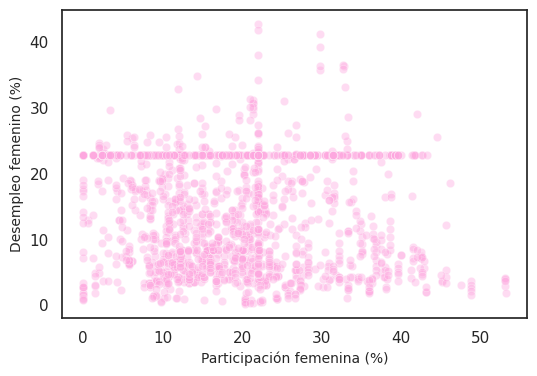

In [ ]:
# Grafico de dispersion para visualizar ambas variables en conjunto

plt.figure(figsize=(6,4))
sns.set_style('white')

sns.scatterplot(data= df_selected,
               x="Fem_parliam", y="Unemp_fem",
               c='#FDA7DF', alpha = 0.4)

plt.ylabel("Desempleo femenino (%)", size=10)
plt.xlabel("Participación femenina (%)", size=10)

Al ver la disposición de los datos, pareciera que la cantidad de datos nulos de desempleo femenino puede marcar un leve sesgo, dada la imputación de datos previa. Pero más allá de esto, el gráfico no parece sugerir una asociación significativa entre variables.

Continúo, aún considerando el posible sesgo, con la creación y entrenamiento de un modelo de regresión lineal que permita analizar numéricamente la asociación entre las dos variables y, eventualmente, predecir el porcentaje de desempleo femenino a partir de la participación política femenina.

##### 6.3.1. Regresión Lineal Simple
Participación política femenina y Desempleo Femenino

In [ ]:
# Separo y preparo feature y target

X_fempar = df_selected[['Fem_parliam']]
y_unemp = df_selected[['Unemp_fem']]

In [ ]:
# Creo las submuestras para entrenamiento y testeo

X_fempar_train, X_fempar_test, y_unemp_train, y_unemp_test = train_test_split(X_fempar, y_unemp, test_size = 0.2, random_state= 42)

print('Dimensiones de submuestras:\n')
print(f"X entrenamiento: {len(X_fempar_train)}")
print(f"X testeo: {len(X_fempar_test)} \n")
print(f"y entrenamiento: {len(y_unemp_train)}")
print(f"y testeo: {len(y_unemp_test)}")

Dimensiones de submuestras:

X entrenamiento: 1318
X testeo: 330 


 y entrenamiento: 1318
y testeo: 330


In [ ]:
# Entrenamiento de modelo de regresion simple

regr1 = LinearRegression()
regr1.fit(X_fempar_train, y_unemp_train)

LinearRegression()

In [ ]:
# Realizo las predicciones del modelo

y_unemp_pred = regr1.predict(X_fempar_test)


In [ ]:
# Calculo metricas de mi modelo

mse_1 = mean_squared_error(y_unemp_test, y_unemp_pred) # Error cuadratico medio

r2_1 = r2_score(y_unemp_test, y_unemp_pred) # Coeficiente de Determinacion (R-squared)

In [ ]:
# Calculo el coeficiente entre la variable predictora y el target

coef1 = regr1.coef_

In [ ]:
# Imprimo cada metrica

print(f"Error Cuadratico Medio (MSE): {mse_1} \n")
print(f"Coeficiente de Determinacion (R-cuadrado): {r2_1} \n")
print(f"Coeficiente: {coef1}")

Error Cuadratico Medio (MSE): 64.3999229573439 

Coeficiente de Determinacion (R-cuadrado): 0.02288049923270108 

Coeficiente: [[-0.06843752]]


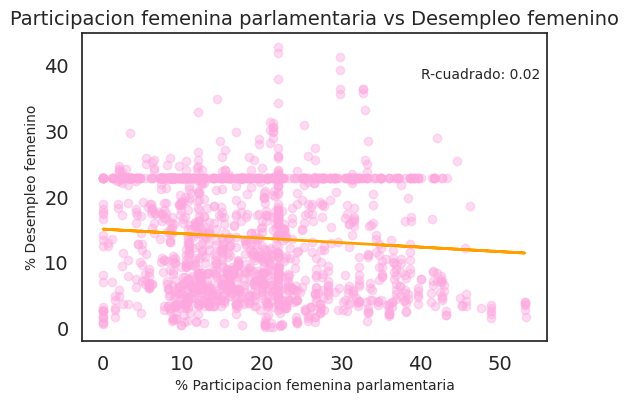

In [ ]:
# Grafico linea de prediccion

plt.figure(figsize=(6,4))
plt.title('Participacion femenina parlamentaria vs Desempleo femenino', fontsize = 14)
plt.xlabel('% Participacion femenina parlamentaria', fontsize = 10)
plt.ylabel('% Desempleo femenino', fontsize = 10)
plt.text(x = 40, y = 38, s = 'R-cuadrado: 0.02', fontsize = 10)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)

# plt.ylim(-5, 50)
# plt.xlim(0, 70)

plt.scatter(X_fempar, y_unemp, color = '#FDA7DF', alpha = 0.4)

plt.plot(X_fempar_test, y_unemp_pred, c = '#FFA000', linewidth = 2) #, alpha = 0.8)

plt.show()

##### 6.3.2. Interpretación de modelo de regresión lineal y conclusiones sobre Objetivo b1)

- Tal como parecía desprenderse del gráfico de dispersión previo, la asociación entre las variables de Porcentaje de Participación Parlamentaria Femenina (`Fem_parliam`) y Porcentaje de Desempleo Femenino (`Unemp_fem`) no muestran una asociación significativa (Coeficiente = -0.06).
- El modelo calculado tiene un MSE muy alto, lo que significa que hay una diferencia significativa entre los valores predichos y los valores reales.
- Como lo indica, a su vez, el Coeficiente de Determinación ($R^2 = 0.02$): el ajuste del modelo de prediccion es muy bajo.

**Esto me lleva a inferir que, a diferencia de lo supuesto inicialmente al iniciar el proyecto, una mayor participacion parlamentaria femenina no implica un menor desempleo femenino, producto de politicas activas para disminuirlo.**

## 7- **Resolución Objetivo b2)**

_Determinar si existe una relación significativa entre el porcentaje de poblaciones rurales de un país y el porcentaje de desempleo femenino._


### 7.1. Exploración de posible asociación entre porcentaje de poblaciones rurales y porcentaje de desempleo femenino

Existe un supuesto que sostiene que el trabajo rural es llevado a cabo mayoritariamente por hombres. Por lo que, frente a países cuya población sea principalmente rural, sería esperable encontrar un mayor porcentaje de desempleo femenino, ya que no contarían con suficientes plazas de trabajo rural.

A continuación examinaré la relación entre las dos variables (`Rural_pop` y `Unemp_fem`) a partir de la visualización de los datos y de la creación de un modelo de regresión lineal simple que busque predecir el desempleo femenino a partir del porcentaje de población rural.

Text(0.5, 0, 'Población Rural (%)')

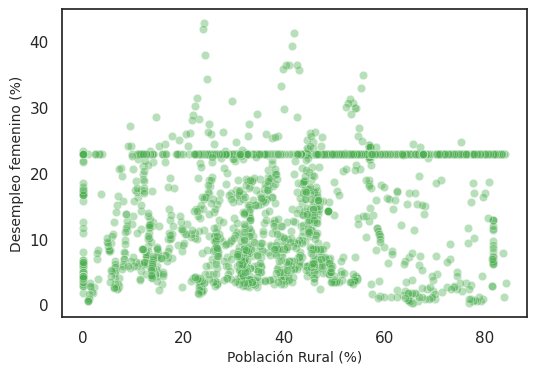

In [ ]:
# Grafico de dispersion para visualizar ambas variables en conjunto

plt.figure(figsize=(6,4))
sns.set_style('white')

sns.scatterplot(data= df_selected,
               x="Rural_pop", y="Unemp_fem",
               c='#4CAF50', alpha = 0.4)

plt.ylabel("Desempleo femenino (%)", size=10)
plt.xlabel("Población Rural (%)", size=10)

Al igual que en la sección 6, en la que se analizó la asociación entre Participación parlamentaria femenina y Desempleo femenino, el gráfico de dispersión de las variables `Unemp_fem` y `Rural_pop` nos sugiere que tal asociación sería débil.
A su vez, en este caso también habría un sesgo producido por el gran número de casos nulos que fueron posteriormente imputados mediante KNN. Sin embargo, incluso si no contáramos con esos datos, no parece haber asociación significativa entre ambas variables.

A continuación extenderé esta examinación a partir de la creación de un modelo de regresión lineal simple.

##### 7.1.1. Regresión Lineal Simple
Porcentaje de Población Rural y Desempleo Femenino

In [ ]:
# Separo y preparo feature (target continúa siendo el desempleo femenino)

X_rural = df_selected[['Rural_pop']]

In [ ]:
# Creo las submuestras para entrenamiento y testeo

X_rural_train, X_rural_test, y_unemp_train2, y_unemp_test2 = train_test_split(X_rural, y_unemp, test_size = 0.2, random_state= 42)

print('Dimensiones de submuestras:\n')
print(f"X entrenamiento: {len(X_rural_train)}")
print(f"X testeo: {len(X_rural_test)} \n")
print(f"y entrenamiento: {len(y_unemp_train2)}")
print(f"y testeo: {len(y_unemp_test2)}")

Dimensiones de submuestras:

X entrenamiento: 1318
X testeo: 330 

y entrenamiento: 1318
y testeo: 330


In [ ]:
# Entrenamiento de modelo de regresion simple

regr2 = LinearRegression()
regr2.fit(X_rural_train, y_unemp_train2)

LinearRegression()

In [ ]:
# Realizo las predicciones del modelo

y_unemp_pred2 = regr2.predict(X_rural_test)

In [ ]:
# Calculo metricas de mi modelo

mse_2 = mean_squared_error(y_unemp_test2, y_unemp_pred2) # Error cuadratico medio

r2_2 = r2_score(y_unemp_test2, y_unemp_pred2) # Coeficiente de Determinacion (R-squared)

In [ ]:
# Calculo el coeficiente entre la variable predictora y el target

coef2 = regr2.coef_

In [ ]:
# Imprimo cada metrica

print(f"Error Cuadratico Medio (MSE): {mse_2} \n")
print(f"Coeficiente de Determinacion (R-cuadrado): {r2_2} \n")
print(f"Coeficiente: {coef2}")

Error Cuadratico Medio (MSE): 63.6759644971721 

Coeficiente de Determinacion (R-cuadrado): 0.03386489015577543 

Coeficiente: [[0.04488959]]


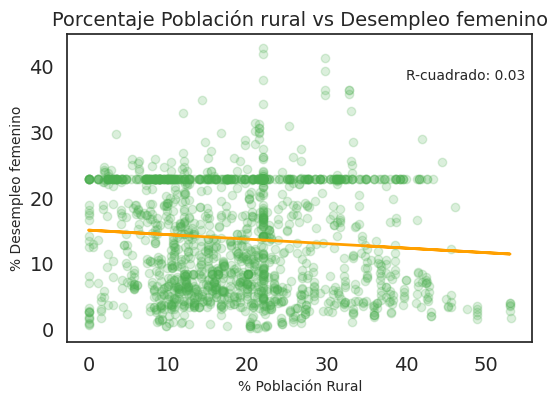

In [ ]:
# Grafico linea de prediccion

plt.figure(figsize=(6,4))
plt.title('Porcentaje Población rural vs Desempleo femenino', fontsize = 14)
plt.xlabel('% Población Rural', fontsize = 10)
plt.ylabel('% Desempleo femenino', fontsize = 10)
plt.text(x = 40, y = 38, s = 'R-cuadrado: 0.03', fontsize = 10)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)

# plt.ylim(-5, 50)
# plt.xlim(0, 70)

plt.scatter(X_fempar, y_unemp, color = '#4CAF50', alpha = 0.2)

plt.plot(X_fempar_test, y_unemp_pred, c = '#FFA000', linewidth = 2) #, alpha = 0.8)

plt.show()

##### 7.1.2. Interpretación de modelo de regresión lineal y conclusiones sobre Objetivo b2)

- Al igual que en la sección 6, visualmente no parece desprenderse del gráfico de dispersión que haya una asociación entre las variables de Porcentaje de Población Rural (`Rural_pop`) y Porcentaje de Desempleo Femenino (`Unemp_fem`) (Coeficiente = 0.04).

- El segundo modelo calculado también tiene un MSE muy alto, que se traduce en una diferencia significativa entre lo predicho y lo real.

- Nuevamente, el Coeficiente de Determinación ($R^2 = 0.02$) marca que el ajuste del modelo de prediccion es muy bajo.

**Los datos indican que, del mismo modo en que ocurrió en la sección 6, debería descartarse el supuesto que sostiene que una población principalmente rural implica un menor desempleo femenino.**

## 8- **Resolución Objetivo c)**

_Explorar las variables más influyentes para determinar el PBI per cápita y desarrollar un modelo de predicción óptimo que permita estimarlo a partir de dichas variables._

Recordemos que en la sección 5 seleccionamos luego de un conjunto de análisis, a las siguientes variables como las de mayor importancia:

- PBI per cápita `GDP_per_cap`

- Porcentaje de Población Rural `Rural_pop`

- Porcentaje de acceso a Red Eléctrica `Electricity`

- Esperanza de Vida `Life_exp`

- Porcentaje de Energía Renovable consumida `Renew_consum`

- Porcentaje de acceso a Internet `Internet`

Sumadas a una variable target: `Income_Class_Encoded`

Para la resolución de este objetivo, seleccionaré como variable target al PBI per cápita.

### 8.1. Tendencia de PBI per cápita por región (2000-2018)

In [ ]:
pbi_means = media_var_region(df_selected, 'GDP_per_cap', region_list)

In [ ]:
# pbi_means

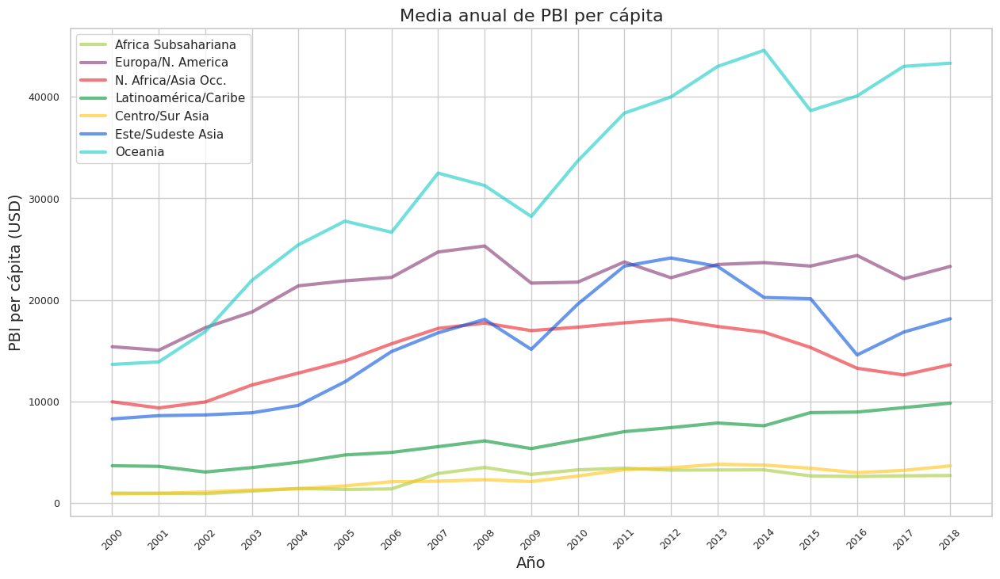

In [ ]:
# Gráfico de medias anuales de % de Participacion Femenina en Parlamentos
sns.set_style('whitegrid')

fig, ax = plt.subplots(figsize = (15,8))


plt.plot(range(len(pbi_means['Sub-Saharan_Africa'])), list(pbi_means['Sub-Saharan_Africa'].values()), color = ssafricol, linewidth = 3, alpha = 0.6, label = 'Africa Subsahariana')
plt.plot(range(len(pbi_means['Europe_and_Northern_America'])), list(pbi_means['Europe_and_Northern_America'].values()), color = euronacol, linewidth = 3, alpha = 0.6, label = 'Europa/N. America')
plt.plot(range(len(pbi_means['Northern_Africa_and_Western_Asia'])), list(pbi_means['Northern_Africa_and_Western_Asia'].values()), color = nafwascol, linewidth = 3, alpha = 0.6, label = 'N. Africa/Asia Occ.')
plt.plot(range(len(pbi_means['Latin_America_and_Caribbean'])), list(pbi_means['Latin_America_and_Caribbean'].values()), color = latamcol, linewidth = 3, alpha = 0.6, label = 'Latinoamérica/Caribe')
plt.plot(range(len(pbi_means['Central_and_Southern_Asia'])), list(pbi_means['Central_and_Southern_Asia'].values()), color = censuacol, linewidth = 3, alpha = 0.6, label = 'Centro/Sur Asia')
plt.plot(range(len(pbi_means['Eastern_and_South-Eastern_Asia'])), list(pbi_means['Eastern_and_South-Eastern_Asia'].values()), color = eseacol, linewidth = 3, alpha = 0.6, label = 'Este/Sudeste Asia')
plt.plot(range(len(pbi_means['Oceania'])), list(pbi_means['Oceania'].values()), color = oceancol, linewidth = 3, alpha = 0.6, label = 'Oceania')


plt.xticks(range(len(pbi_means['Oceania'])), list(pbi_means['Oceania'].keys()), fontsize = 9, rotation = 45)
plt.yticks(fontsize = 9)

ax.set_title('Media anual de PBI per cápita', fontsize = 16)
ax.set_ylabel('PBI per cápita (USD)', fontsize = 14)
ax.set_xlabel('Año', fontsize = 14)
ax.legend()


plt.show()

- Al igual que con el porcentaje de participación parlamentaria femenina, la región de Oceanía es la que exhibe valores más altos de PBI per cápita a lo largo de los años, y se separa ampliamente de la región con el segundo PBI per cápita más alto: Europa y Norteamérica.

- Las regiones del Este/Sudeste Asiático y del Norte de África/Occidente Asiático han tenido una suba de su PBI a partir del comienzo de la década de 2010, pero han registrado bajas desde 2014. Actualmente parecen encontrarse en una leve tendencia de mejora.

- Las regiones con el PBI per cápita más bajo son África Subsahariana, Centro/Sur de Asia y Latinoamérica/Caribe, aunque esta última se separa de las primeras dos y se encuentra en una tendencia ascendente desde 2014.

- Parece haber una gran desigualdad de la riqueza entre las distintas regiones, tal como fue planteado al inicio de este proyecto.

A continuación realizaré un modelo de regresión lineal múltiple con el fin de analizar la relación entre mis variables predictoras y el PBI per cápita, y posteriormente a partir del mismo intentar crear una función que ayude a predecir el PBI per cápita de un país.

### 8.2. Regresión Lineal Múltiple

##### 8.2.1 Modelo 1 de Regresion Lineal Multiple

In [ ]:
# Divido mis variables predictoras y mi nueva variable target

X_important = num_var_important.drop('GDP_per_cap', axis = 1, inplace = False)
print(X_important.columns, X_important.shape)

y_pbi = num_var_important[['GDP_per_cap']]
print(y_pbi.shape)

Index(['Electricity', 'Renew_consum', 'Internet', 'Life_exp', 'Rural_pop',
       'Income_Class_Encoded'],
      dtype='object') (1648, 6)
(1648, 1)


In [ ]:
# Creo el objeto de mi nuevo modelo

regr3 = LinearRegression()

In [ ]:
# Entreno el modelo de regresion multiple utilizando Cross Validation (cross_val_score)
# Utilizo 5 particiones como valor de 'cv'

mse3 = -cross_val_score(regr3, X_important, y_pbi, scoring='neg_mean_squared_error', cv=5).mean()

r2_3 = cross_val_score(regr3, X_important, y_pbi, scoring='r2', cv=5).mean()

In [ ]:
print(f"Metricas del Modelo de Regresion Multiple 1:\n")
print(f"Error Cuadratico Medio (MSE): {mse3.round(2)} \n")
print(f"Coeficiente de Determinacion (R-cuadrado): {r2_3} \n")


Metricas del Modelo de Regresion Multiple 1:

Error Cuadratico Medio (MSE): 125819821.09 

Coeficiente de Determinacion (R-cuadrado): 0.5769220058962394 



El Modelo 1 tiene un MSE muy alto, que puede estar relacionado con la escala de la variable target (PBI per capita).
A su vez, el Coeficiente de Determinacion nos indica que hay un ajuste relativamente bajo del modelo, aproximadamente un 57% de la variacion del PBI per capita es explicada por las variables predictoras.

A continuación haré una normalización de las variables predictoras y de la variable objetivo.

##### 8.2.2. Modelo 2: Normalización de Variables

In [ ]:
# Normalizo mis variables predictoras

scaler = StandardScaler()
X_important_normalized = pd.DataFrame(scaler.fit_transform(X_important), columns = X_important.columns)


In [ ]:
X_important_normalized

,Electricity,Renew_consum,Internet,Life_exp,Rural_pop,Income_Class_Encoded
0,-2.242064,1.440294,-1.135885,-3.080542,0.455750,-0.480773
1,-2.199819,1.253733,-1.132322,-2.983918,0.398516,-0.480773
2,-2.157990,1.139805,-1.128977,-2.876165,0.341380,0.386091
3,-2.116616,1.368127,-1.104870,-2.758069,0.284679,0.386091
4,-2.075599,1.147281,-1.092200,-2.630022,0.247748,0.386091
...,...,...,...,...,...,...
1643,-2.011028,1.806098,-0.564100,-1.678574,1.420447,-0.480773
1644,-1.956356,1.829140,-0.337506,-1.531412,1.426200,-0.480773
1645,-1.722973,1.877379,-0.324106,-1.431907,1.430502,-0.480773
1646,-1.704694,1.902123,-0.278631,-1.364087,1.433354,-0.480773


In [ ]:
# Transformo mi variable target (PBI per capita) a su logaritmo

y_pbi_log = np.log(y_pbi)

In [ ]:
y_pbi_log

,GDP_per_cap
21,6.771356
22,6.890569
23,7.135341
24,7.550883
25,7.863100
...,...
3282,7.268848
3283,7.275913
3284,7.289330
3285,7.197185


In [ ]:
# Creo el objeto de mi nuevo modelo

regr4 = LinearRegression()

In [ ]:
# Entreno el modelo de regresion multiple con variables normalizadas y utilizando Cross Validation (cross_val_score)
# Utilizo nuevamente 5 particiones como valor de 'cv'

mse4 = -cross_val_score(regr4, X_important_normalized, y_pbi_log, scoring='neg_mean_squared_error', cv=5).mean()

r2_4 = cross_val_score(regr4, X_important_normalized, y_pbi_log, scoring='r2', cv=5).mean()

In [ ]:
# Reviso las nuevas metricas luego de normalizar variables

print(f"Metricas del Modelo de Regresion Multiple 2:\n")
print(f"Error Cuadratico Medio (MSE): {mse4.round(2)} \n")
print(f"Coeficiente de Determinacion (R-cuadrado): {r2_4} \n")

Metricas del Modelo de Regresion Multiple 2:

Error Cuadratico Medio (MSE): 0.41 

Coeficiente de Determinacion (R-cuadrado): 0.7613997770452664 



**El hecho de haber normalizado mis variables ayuda a mejorar notablemente el rendimiento de mi modelo.
El MSE ahora muestra valores de error más bajos, y $R^2$ muestra un ajuste notablemente mejor (0.76) que aquel del Modelo 1 (0.57)**

A continuacion revisare los coeficientes del modelo 2, para determinar la relacion de cada variable con la variable target y asi decidir si sacare alguna de ellas:

In [ ]:
regr4.fit(X_important_normalized, y_pbi_log)

LinearRegression()

In [ ]:
coefs4 = pd.DataFrame(data = regr4.coef_.transpose(), index = X_important_normalized.columns, columns = ['Coefficient'])
coefs4

,Coefficient
Electricity,0.149427
Renew_consum,-0.189283
Internet,0.404187
Life_exp,0.111197
Rural_pop,-0.506004
Income_Class_Encoded,-0.291398


**Vemos aqui que las variables que mas influyen sobre la variacion del PBI per capita en nuestro modelo son:**

- `Rural_pop`
- `Internet`
- `Income_Class_Encoded`
- `Renew_consum`

A continuacion creare un Modelo 3 que incluya como variables predictoras exclusivamente a estas 4 variables y comparare sus metricas con las del Modelo 2

##### 8.2.3. Modelo 3: reduccion del numero de variables predictoras

In [ ]:
# Elimino las variables menos influyentes de mi dataframe de predictoras

X_important_reduced = X_important_normalized.drop(['Electricity','Life_exp'], axis = 1, inplace = False)
X_important_reduced.head(3)

,Renew_consum,Internet,Rural_pop,Income_Class_Encoded
0,1.440294,-1.135885,0.455750,-0.480773
1,1.253733,-1.132322,0.398516,-0.480773
2,1.139805,-1.128977,0.341380,0.386091


In [ ]:
# Creo el objeto de mi nuevo modelo

regr5 = LinearRegression()

In [ ]:
# Entreno el modelo de regresion multiple con variables normalizadas y REDUCIDAS
# Utilizando Cross Validation (cross_val_score) nuevamente con 5 particiones como valor de 'cv'

mse5 = -cross_val_score(regr5, X_important_reduced, y_pbi_log, scoring='neg_mean_squared_error', cv=5).mean()

r2_5 = cross_val_score(regr5, X_important_reduced, y_pbi_log, scoring='r2', cv=5).mean()

In [ ]:
# Reviso las nuevas metricas luego de normalizar variables

print(f"Metricas del Modelo de Regresion Multiple 3:\n")
print(f"Error Cuadratico Medio (MSE): {mse5.round(2)} \n")
print(f"Coeficiente de Determinacion (R-cuadrado): {r2_5} \n")

Metricas del Modelo de Regresion Multiple 3:

Error Cuadratico Medio (MSE): 0.42 

Coeficiente de Determinacion (R-cuadrado): 0.7593048013973183 



A juzgar por las metricas del Modelo 3, eliminar variables menos influyentes no mejora el rendimiento del modelo de prediccion en comparacion con el modelo 2

### 8.3 Eleccion de mejor modelo predictor de PBI per capita

In [ ]:
mse_values = [mse3.round(2), mse4.round(2), mse5.round(2)]
r2_values = [r2_3.round(2), r2_4.round(2), r2_5.round(2)]

# Creo diccionario con los valores de las métricas
score_dict = {
    'MSE': mse_values,
    'R-Cuadrado': r2_values
}

# Crear el DataFrame
scores_modelos = pd.DataFrame(score_dict, index=['Modelo 1', 'Modelo 2', 'Modelo 3'])

# Imprimir el DataFrame
scores_modelos

,MSE,R-Cuadrado
Modelo 1,1.258198e+08,0.58
Modelo 2,4.100000e-01,0.76
Modelo 3,4.200000e-01,0.76


Viendo las metricas de los 3 modelos evaluados, considero que **es mas apropiado utilizar el Modelo 2 de regresion multiple entrenado con Cross Validation**. Este muestra un MSE y un $R^2$ apenas mejor que el Modelo 3. El modelo, que fue estimado a partir de variables que no estaban normalizadas, no mostro buenas metricas.

## 9- Resolucion Objetivo d)

_Generar un modelo de clasificación que permita determinar la clase de ingreso económico (en inglés: Income class) de un país._

### 9.1. Exploración de la variable Clase de Ingreso Economico (`Income_Class_Encoded`)

Código de colores Income Class

In [ ]:
inc_color = {
    0.0:"#9c88ff",
    1.0:"#eb2f06",
    2.0:"#f6b93b",
    3.0:"#b8e994"
}

inc_color_list = [
    "#9c88ff",
    "#eb2f06",
    "#f6b93b",
    "#b8e994"
]

##### 9.1.1. Piechart mostrando composición de los datos

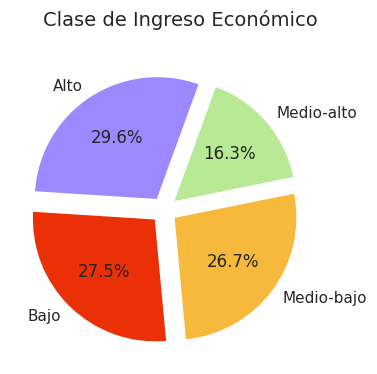

In [ ]:
sns.set(rc={'figure.figsize':(4,4)})
# sns.set_theme(palette= inc_color)

plt.pie(df_limpio['Income_Class_Encoded'].value_counts(),colors = inc_color_list,
        labels = ('Alto', 'Bajo', 'Medio-bajo', 'Medio-alto'),
        autopct = '%.1f%%', labeldistance = 1.1,
        startangle = 70, explode = (0.1, 0.1, 0.1, 0.1))

plt.title("Clase de Ingreso Económico\n", fontsize = 14, loc = 'right')
plt.show()

El Piechart nos muestra que la variable se encuentra distribuida de manera medianamente equitativa, con una mayor cantidad de casos de Ingreso economico alto

In [ ]:
# Establezco orden del hue
hue_order = [0.0, 3.0, 2.0, 1.0]

**Recordatorio**
- **0.0 = Ingreso Alto (High Income)** -> Lila

- **1.0 = Ingreso Bajo (Low Income)** -> Rojo

- **2.0 = Ingreso Medio-Bajo (Lower-middle Income)** -> Naranja

- **3.0 = Ingreso Medio-Alto (Upper-middle Income)** -> Verde

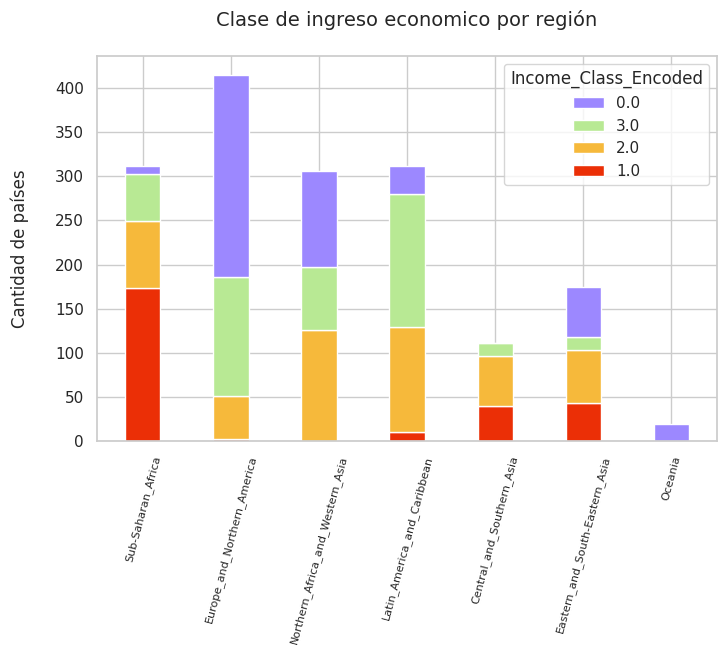

In [ ]:
sns.set(rc={'figure.figsize': (8, 5)})
sns.set_style(style = 'whitegrid')
sns.histplot(data=df_limpio, x='Region', hue='Income_Class_Encoded',
             hue_order = hue_order, stat='count',
             multiple='stack', palette =inc_color, alpha = 1, shrink = .4)

plt.xticks(fontsize = 8, rotation = 75)
plt.xlabel('')
plt.ylabel('Cantidad de países\n')
plt.title('Clase de ingreso economico por región\n', fontsize = 14)

plt.show()

- El histograma nos muestra que en África subsahariana tenemos la mayor cantidad de países con ingresos económicos bajos y la menor cantidad de ingresos económicos altos.

- De manera inversa, la región de Europa y Norteamérica es la que exhibe mayor cantidad de casos de Clase Alta de ingresos económicos, y ningún caso de país con clase de ingreso económico Bajo. Esto mismo sucede en la región de Oceanía.

### 9.2. Modelo de Clasificación de Ingreso Económico

##### 9.2.1. Preparacion de variables

In [ ]:
# Preparo dataframe de mis variables predictoras
X_classif = num_var_important.drop('Income_Class_Encoded', axis = 1, inplace = False)

In [ ]:
X_classif_normalized = pd.DataFrame(scaler.fit_transform(X_classif), columns = X_classif.columns, index = num_var_important.index)

In [ ]:
X_classif_normalized

,Electricity,GDP_per_cap,Renew_consum,Internet,Life_exp,Rural_pop
21,-2.242064,-0.654021,1.440294,-1.135885,-3.080542,0.455750
22,-2.199819,-0.647623,1.253733,-1.132322,-2.983918,0.398516
23,-2.157990,-0.631834,1.139805,-1.128977,-2.876165,0.341380
24,-2.116616,-0.594368,1.368127,-1.104870,-2.758069,0.284679
25,-2.075599,-0.553990,1.147281,-1.092200,-2.630022,0.247748
...,...,...,...,...,...,...
3282,-2.011028,-0.621447,1.806098,-0.564100,-1.678574,1.420447
3283,-1.956356,-0.620858,1.829140,-0.337506,-1.531412,1.426200
3284,-1.722973,-0.619727,1.877379,-0.324106,-1.431907,1.430502
3285,-1.704694,-0.627195,1.902123,-0.278631,-1.364087,1.433354


In [ ]:
# Preparo mi variable target: Income_Class_Encoded

y_income = num_var_important[['Income_Class_Encoded']]

In [ ]:
y_income

,Income_Class_Encoded
21,1.0
22,1.0
23,2.0
24,2.0
25,2.0
...,...
3282,1.0
3283,1.0
3284,1.0
3285,1.0


In [ ]:
# Divido mis datos en conjunto de entrenamiento y prueba

X_classif_train, X_classif_test, y_income_train, y_income_test = train_test_split(X_classif_normalized, y_income,
                                                                                  test_size = 0.2, random_state = 42)

print('Dimensiones de submuestras:\n')
print(f"X entrenamiento: {len(X_classif_train)}")
print(f"X testeo: {len(X_classif_test)} \n")
print(f"y entrenamiento: {len(y_income_train)}")
print(f"y testeo: {len(y_income_test)}")

Dimensiones de submuestras:

X entrenamiento: 1318
X testeo: 330 

y entrenamiento: 1318
y testeo: 330


##### 9.2.2. Optimizacion de hiperparametros

In [ ]:
# Creo mi modelo de XGBoost

boost = xgb.XGBClassifier()

Como voy a utilizar una tecnica de optimizacion de hiperparametros para buscar el mejor modelo de clasificacion, voy a definir los hiperparametros a ajustar

In [ ]:
param_dict = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 1.0], # Tasa de aprendizaje
    'n_estimators': [25, 50, 100], # Nro de arboles que se construiran
    'subsample': [0.5, 0.9, 1.0], # Proporcion de muestras utilizadas
    'gamma': [0, 1, 5] # Cantidad mín. de reducción de pérdida p/ particion
}

Realizo una Randomized Search con cross validation **RandomizedSearchCV**, buscando la mejor combinacion de hiperparametros para mi modelo de clasificacion.

In [ ]:
random_search = RandomizedSearchCV(boost, param_dict, scoring = 'accuracy',
                                   cv = 5, n_iter = 10) # No uso mayores particiones porque no tengo un gran numero de datos


In [ ]:
# Entreno mi modelo con mis submuestras de entrenamiento
random_search.fit(X_classif_train, y_income_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_delta_step=None, max_depth=None,
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None, ...),
                   param_distributions={'gamma': [0, 1, 5],
                                        'learning_rate': [0.01, 0.1, 1.0],
                                        'max_depth': [3, 5, 7],
                                        'n_estimators': [25, 50, 100],
                                        'subsample': [0.5, 0.9, 1.0]},
                   scoring='accuracy')

In [ ]:
# Exploro cuales son los mejores hiperparametros y el mejor modelo segun mi busqueda
best_params = random_search.best_params_
best_model = random_search.best_estimator_

##### 9.2.3. Entrenamiento de Modelo de Clasificacion Optimizado

In [ ]:
#Pruebo el mejor modelo con mi conjunto de entrenamiento

y_income_pred = best_model.predict(X_classif_test)

In [ ]:
# Calculo precision del modelo

acc = accuracy_score(y_income_test, y_income_pred)

In [ ]:
# Calculo mi matriz de confusion (Confusion matrix)
confusion_mxt = confusion_matrix(y_income_test, y_income_pred)

##### 9.2.4. Precisión del Modelo de Clasificación Optimizado

In [ ]:
print(f"Precision del Modelo de Clasificacion Optimizado: {acc.round(2)}")

Precision del Modelo de Clasificacion Optimizado: 0.93


El modelo optimizado obtenido a partir de una randomized search en un modelo XGBoost arrojo un alto nivel de precision $Accuracy = 0.93$. Es decir que **el modelo clasifico correctamente al 93% de los casos.**

##### 9.2.5. Matriz de Confusión de Modelo Optimizado

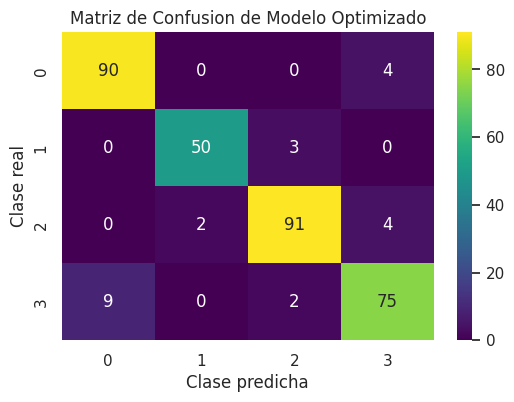

In [ ]:
plt.figure(figsize = (6,4))
sns.heatmap(confusion_mxt, annot = True, fmt="d", cmap="viridis")

plt.xlabel("Clase predicha")
plt.ylabel("Clase real")
plt.title("Matriz de Confusion de Modelo Optimizado")

plt.show()

**A partir de esta matriz de confusion vemos la pequeña diferencia que hubo entre los valores reales y los valores predichos**

##### 9.2.6. Informe de Clasificacion

In [ ]:
classification_inf = classification_report(y_income_test, y_income_pred)
print("Informe de clasificación:")
print(classification_inf)

Informe de clasificación:
              precision    recall  f1-score   support

         0.0       0.91      0.96      0.93        94
         1.0       0.96      0.94      0.95        53
         2.0       0.95      0.94      0.94        97
         3.0       0.90      0.87      0.89        86

    accuracy                           0.93       330
   macro avg       0.93      0.93      0.93       330
weighted avg       0.93      0.93      0.93       330



**En el informe de clasificación podemos ver un desglose de los resultados del modelo optimizado. En general las métricas más bajas correspondieron a la clasificación de la clase 3 (Ingreso Económico Medio-Alto). Sin embargo, en general las 4 clases diferentes han sido correctamente clasificadas por el modelo.**

### 9.3. Conclusión

**Comenzando por los análisis multivariados de la sección 4, la selección e ingeniería de atributos en la sección 5, pasando por la normalización de variables y los modelos lineales generados en la sección 8 y gracias a la optimización final de hiperparámetros realizada en la presente sección, se ha obtenido como producto final un modelo de clasificación de ingreso económico optimizado con un gran poder de clasificación y precisión.**